# Fine-tuning DenseNet201 with ImageNet Pretrained Weights

## Transfer Learning with Progressive Unfreezing + Discriminative Learning Rates

**Pretrained Model**: 
- **Architecture**: DenseNet201 (Densely Connected Convolutional Networks)
- **Source**: ImageNet pretrained weights from torchvision
- **Parameters**: ~20M parameters, 1920-dimensional features
- **Pretraining**: ImageNet-1K (1.28M images, 1000 classes)

**Datasets**:
- **EuroSAT** (In-Distribution): European land cover satellite imagery with 10 scene classes
- **UC Merced** (Out-of-Distribution): Land use classification dataset (21 classes, 5 used as OOD)

**Transfer Learning Strategy**:
1. **Load ImageNet Pretrained Weights** ✅
   - Use torchvision's pretrained DenseNet201
   - Leverage features learned from 1.28M natural images
   - Adapt to satellite imagery domain
   
2. **Progressive Unfreezing** 🌡️
   - **Phase 1 (Epochs 0-40)**: Classifier only (encoder frozen)
   - **Phase 2 (Epochs 41-80)**: Classifier + DenseBlock4 (top dense block)
   - **Phase 3 (Epochs 81-120)**: Classifier + DenseBlocks 3-4
   - **Phase 4 (Epochs 121-150)**: Full model fine-tuning
   
3. **Discriminative Learning Rates (DiffLR)** 📊
   - **Core Concept**: HIGH LR for head, LOW LR for backbone
   - **Classifier (Head)**: 5e-4 (moderate - fast adaptation to satellite imagery)
   - **Encoder (Backbone)**: 1e-6 (very low - preserve ImageNet features)
   - **LR Ratio**: 500x difference (head learns 500x faster than backbone)


- **Discriminative learning rates (DiffLR)** to maximize transfer learning- Anti-overfitting strategies (dropout 0.3, weight decay, label smoothing)
- MC Dropout for uncertainty quantification

## 1. Import Libraries

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Subset
import torchvision
from torchvision import transforms
from torchvision.datasets import EuroSAT

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_auc_score, roc_curve, precision_recall_curve, auc
from tqdm.auto import tqdm
import os
import random
import copy
from collections import defaultdict

# Set random seeds for reproducibility
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    # NOTE: For maximum GPU performance, we enable cudnn.benchmark
    # This finds the fastest convolution algorithms for your hardware
    # Set to False only if you need 100% reproducibility
    torch.backends.cudnn.deterministic = False  # Allow non-deterministic ops for speed
    torch.backends.cudnn.benchmark = True  # Enable cuDNN autotuner for best performance

set_seed(42)

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
print(f"PyTorch version: {torch.__version__}")

Using device: cuda
PyTorch version: 2.5.1+cu121


/home/RA001/Documents/OOD-MCD-GeoCV/env_ood/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# ==========================================
# CONFIGURATION - DENSENET201 WITH IMAGENET PRETRAINING
# ==========================================

# ✔ DENSENET201 REQUIRES 224x224 INPUT
IMG_SIZE = 224  # Standard input size for ImageNet pretrained models
BATCH_SIZE = 128  # Balanced for DenseNet201 (smaller batches = better generalization)
NUM_WORKERS = 6  # Enable parallel data loading on Linux (0 for Windows)

# Note: Using ImageNet pretrained weights from torchvision
# No custom pretrained model path needed - will use pretrained=True in torchvision

# ==========================================
# ANTI-OVERFITTING STRATEGIES
# ==========================================
# 1. INCREASED DROPOUT
DROPOUT_RATE = 0.3  # Increased from 0.1 to 0.3 (stronger regularization)

# 2. WEIGHT DECAY (L2 Regularization)
WEIGHT_DECAY = 1e-4  # L2 penalty on weights

# 3. LABEL SMOOTHING
LABEL_SMOOTHING = 0.1  # Smooth labels to prevent overconfidence

# 4. EARLY STOPPING
EARLY_STOPPING_PATIENCE = 15  # Stop if no improvement for 15 epochs

# 5. LEARNING RATE REDUCTION
CLASSIFIER_LR = 5e-4   # REDUCED from 1e-3 (slower = less overfitting)
ENCODER_LR = 1e-6      # Very low LR for encoder backbone

# Supervised Fine-tuning Parameters
NUM_EPOCHS = 150  # Reduced from 200 (less chance to overfit)
LEARNING_RATE = 0.001
MC_SAMPLES = 50  # Number of MC dropout samples

# Progressive Unfreezing Schedule
UNFREEZE_SCHEDULE = {
    0: 'classifier_only',      # Epochs 0-40: Only train classifier (LONGER)
    41: 'with_layer4',         # Epochs 41-80: Unfreeze ResNet layer4
    81: 'with_layer3_4',       # Epochs 81-120: Unfreeze layers 3-4
    121: 'full_model'          # Epochs 121-150: Full fine-tuning
}

LR_RATIO = CLASSIFIER_LR / ENCODER_LR  # Learning rate ratio

print("="*80)
print("✅ CONFIGURATION - RESNET50 WITH ANTI-OVERFITTING")
print("="*80)
print(f"🔧 ResNet50 Adaptations:")
print(f"  • Image Size: {IMG_SIZE}px")
print(f"  • Batch Size: {BATCH_SIZE} (reduced for better generalization)")
print(f"  • Feature Dim: 2048 (ResNet50 output)")
print("✅ CONFIGURATION - DENSENET201 WITH IMAGENET PRETRAINING")
print(f"  • Dropout Rate: {DROPOUT_RATE} (3x stronger)")
print(f"🔧 DenseNet201 Configuration:")
print(f"  • Architecture: DenseNet201 (Densely Connected CNN)")
print(f"  • Pretrained: ImageNet-1K (1.28M images)")
print(f"  • Image Size: {IMG_SIZE}px (ImageNet standard)")
print(f"  • Batch Size: {BATCH_SIZE}")
print(f"  • Feature Dim: 1920 (DenseNet201 output)")
print(f"  • Parameters: ~20M")
print(f"\n🛡️ Anti-Overfitting Strategies:")
print(f"  • Dropout Rate: {DROPOUT_RATE} (strong regularization)")
print(f"  • Weight Decay: {WEIGHT_DECAY} (L2 regularization)")
print(f"  • Label Smoothing: {LABEL_SMOOTHING}")
print(f"  • Early Stopping: {EARLY_STOPPING_PATIENCE} epochs patience")
print(f"  • Moderate LR: Classifier={CLASSIFIER_LR:.0e}")
print(f"\n📊 Transfer Learning Strategy:")

✅ CONFIGURATION - RESNET50 WITH ANTI-OVERFITTING
🔧 ResNet50 Adaptations:
  • Image Size: 224px
  • Batch Size: 128 (reduced for better generalization)
  • Feature Dim: 2048 (ResNet50 output)
✅ CONFIGURATION - DENSENET201 WITH IMAGENET PRETRAINING
  • Dropout Rate: 0.3 (3x stronger)
🔧 DenseNet201 Configuration:
  • Architecture: DenseNet201 (Densely Connected CNN)
  • Pretrained: ImageNet-1K (1.28M images)
  • Image Size: 224px (ImageNet standard)
  • Batch Size: 128
  • Feature Dim: 1920 (DenseNet201 output)
  • Parameters: ~20M

🛡️ Anti-Overfitting Strategies:
  • Dropout Rate: 0.3 (strong regularization)
  • Weight Decay: 0.0001 (L2 regularization)
  • Label Smoothing: 0.1
  • Early Stopping: 15 epochs patience
  • Moderate LR: Classifier=5e-04

📊 Transfer Learning Strategy:


## 2. Load Pretrained Model (Skipping Pretraining)

### 2.1. Model Architecture

**Transfer Learning from ImageNet**: We use DenseNet201 pretrained on ImageNet-1K, which provides strong feature representations learned from 1.28 million natural images.

**DenseNet201 Architecture**:
- **Dense Connectivity**: Each layer receives inputs from all preceding layers
- **Growth Rate**: 32 (number of feature maps added per layer)
- **Dense Blocks**: 4 blocks with 6, 12, 48, and 32 layers respectively
- **Feature Dimension**: 1920 (output of final dense block)
- **Total Layers**: 201 convolutional layers

- **Parameters**: ~20M parameters- Strong performance on fine-grained classification tasks

- Feature reuse reduces parameters compared to ResNet

**Transfer Learning Components**:- Better gradient flow enables training of very deep networks

- **Encoder**: DenseNet201 pretrained on ImageNet (frozen initially)- Dense connections improve feature propagation

- **Classifier**: New classification head for EuroSAT (10 classes)**Why DenseNet for Satellite Imagery?**

- **Progressive Unfreezing**: Gradually unfreeze dense blocks during training

In [3]:
# ==========================================
# MODEL ARCHITECTURES - DENSENET201 ENCODER
# ==========================================
import torchvision.models as models

class DenseNet201Encoder(nn.Module):
    """
    DenseNet201 Encoder: Uses ImageNet pretrained DenseNet201 as feature extractor.
    Extracts 1920-dimensional feature representations from the final dense block.
    
    Architecture:
    - 4 Dense Blocks with dense connectivity
    - Growth rate: 32
    - Total layers: 201
    - Feature dim: 1920
    """
    def __init__(self, pretrained=True, dropout_rate=0.3):
        super(DenseNet201Encoder, self).__init__()
        
        # Load pretrained DenseNet201 from ImageNet
        densenet = models.densenet201(pretrained=pretrained)
        
        # Extract features (everything except classifier)
        self.features = densenet.features
        
        # Add adaptive pooling to get fixed-size output
        self.pool = nn.AdaptiveAvgPool2d((1, 1))
        
        # Feature dimension is 1920 for DenseNet201
        self.feature_dim = 1920
        
        # Optional dropout for regularization
        self.dropout = nn.Dropout(p=dropout_rate)
        
        pretrain_source = "ImageNet-1K" if pretrained else "random initialization"
        print(f"✓ DenseNet201 Encoder initialized (pretrained={pretrained})")
        print(f"  Pretrained on: {pretrain_source}")
        print(f"  Parameters: ~20M")
        
    def forward(self, x):
        # Extract features through dense blocks
        x = self.features(x)  # [B, 1920, H, W]
        x = F.relu(x, inplace=True)
        x = self.pool(x)  # [B, 1920, 1, 1]
        x = x.view(x.size(0), -1)  # [B, 1920]
        x = self.dropout(x)
        return x


class ProjectionHead(nn.Module):
    """
    Projection head for contrastive learning (SimCLR style).
    Maps 1920-dim DenseNet201 features to projection_dim space.
    """
    def __init__(self, input_dim=1920, projection_dim=128):
        super(ProjectionHead, self).__init__()
        self.projection = nn.Sequential(
            nn.Linear(input_dim, 512),
            nn.ReLU(inplace=True),
            nn.Linear(512, projection_dim)
        )

    def forward(self, x):
        return self.projection(x)


class ClassificationHead(nn.Module):
    """
    Classification head for supervised learning.
    Designed for DenseNet201's 1920-dim features.
    """
    def __init__(self, input_dim=1920, num_classes=10, dropout_rate=0.3):
        super(ClassificationHead, self).__init__()
        self.classifier = nn.Sequential(
            nn.Linear(input_dim, 512),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout_rate),
            nn.Linear(512, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout_rate),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        return self.classifier(x)


class ContrastiveModel(nn.Module):
    """
    Full model combining DenseNet201 encoder and projection head.
    (Not used in this notebook - included for compatibility)
    """
    def __init__(self, pretrained=True, dropout_rate=0.3, projection_dim=128):
        super(ContrastiveModel, self).__init__()
        self.encoder = DenseNet201Encoder(pretrained=pretrained, dropout_rate=dropout_rate)
        self.projection_head = ProjectionHead(self.encoder.feature_dim, projection_dim)

    def forward(self, x):
        features = self.encoder(x)
        projections = self.projection_head(features)
        return features, projections


class SupervisedModel(nn.Module):
    """
    Supervised model with ImageNet pretrained DenseNet201 encoder and classification head.
    Used for transfer learning from ImageNet to satellite imagery.
    """
    def __init__(self, encoder, num_classes=10, dropout_rate=0.3):
        super(SupervisedModel, self).__init__()
        self.encoder = encoder
        # Get feature dimension from encoder (1920 for DenseNet201)
        feature_dim = encoder.feature_dim if hasattr(encoder, 'feature_dim') else 1920
        self.classifier = ClassificationHead(feature_dim, num_classes, dropout_rate)

    def forward(self, x):
        features = self.encoder(x)
        logits = self.classifier(features)
        return logits


print("✅ MODEL ARCHITECTURES - DENSENET201 WITH IMAGENET PRETRAINING")
print("  ✓ DenseNet201Encoder: ImageNet pretrained feature extraction (1920-dim)")
print("  ✓ ProjectionHead: Contrastive learning projection")
print("  ✓ ClassificationHead: Supervised classification with MC Dropout")
print("  ✓ ContrastiveModel: DenseNet201 + Projection (for pretraining)")
print("  ✓ SupervisedModel: DenseNet201 + Classifier (transfer learning)")
print("")
print("  📦 DenseNet201 Details:")
print("     - Pretrained on: ImageNet-1K (1.28M images, 1000 classes)")
print("     - Architecture: 4 Dense Blocks, 201 layers")
print("     - Dense connectivity: Each layer receives all preceding features")
print("     - Growth rate: 32 feature maps per layer")
print("     - Parameters: ~20M")
print("="*80)

✅ MODEL ARCHITECTURES - DENSENET201 WITH IMAGENET PRETRAINING
  ✓ DenseNet201Encoder: ImageNet pretrained feature extraction (1920-dim)
  ✓ ProjectionHead: Contrastive learning projection
  ✓ ClassificationHead: Supervised classification with MC Dropout
  ✓ ContrastiveModel: DenseNet201 + Projection (for pretraining)
  ✓ SupervisedModel: DenseNet201 + Classifier (transfer learning)

  📦 DenseNet201 Details:
     - Pretrained on: ImageNet-1K (1.28M images, 1000 classes)
     - Architecture: 4 Dense Blocks, 201 layers
     - Dense connectivity: Each layer receives all preceding features
     - Growth rate: 32 feature maps per layer
     - Parameters: ~20M


## 3. Supervised Fine-tuning with MC Dropout (Stage 2)

- **Method**: Transfer learning + Monte Carlo Dropout
- **Purpose**: Task-specific classification with uncertainty quantification
- **Data**: Labeled ID classes for training, OOD classes for evaluation
- **Output**: Calibrated predictions with epistemic uncertainty


In [5]:
from datasets import load_dataset, DownloadConfig

# Increase timeout for dataset loading
download_config = DownloadConfig()

# Load ID dataset (EuroSAT)
id_dataset = load_dataset("jonathan-roberts1/EuroSAT", split='train', download_config=download_config)
print(f"Total samples in EuroSAT: {len(id_dataset)}")
print(f"Classes: {id_dataset.features['label'].names}")

# Load OOD dataset (UC Merced - keeping intact)
ood_dataset = load_dataset("blanchon/UC_Merced", split='train', download_config=download_config)
print(f"Total samples in UC Merced: {len(ood_dataset)}")
print(f"Classes: {ood_dataset.features['label'].names}")

# Define In-Distribution classes (using all EuroSAT classes)
# EuroSAT has 10 classes: AnnualCrop, Forest, HerbaceousVegetation, Highway, Industrial,
# Pasture, PermanentCrop, Residential, River, SeaLake
ID_CLASS_NAMES = id_dataset.features['label'].names

# Define OOD classes from UC Merced (keeping as specified)
OOD_CLASS_NAMES = ['intersection', 'beach', 'tenniscourt', 'parkinglot', 'runway']

# Map class names to their integer labels for both datasets
id_label_map = {name: i for i, name in enumerate(id_dataset.features['label'].names)}
ood_label_map = {name: i for i, name in enumerate(ood_dataset.features['label'].names)}

ID_CLASSES = [id_label_map[name] for name in ID_CLASS_NAMES]
OOD_CLASSES = [ood_label_map[name] for name in OOD_CLASS_NAMES]

NUM_CLASSES = len(ID_CLASSES)  # Number of ID classes for the model output

print(f"\nUsing In-Distribution Classes (EuroSAT): {ID_CLASS_NAMES}")
print(f"Using Out-of-Distribution Classes (UC Merced): {OOD_CLASS_NAMES}")
print(f"Number of ID classes for model output: {NUM_CLASSES}")

Total samples in EuroSAT: 27000
Classes: ['annual crop', 'forest', 'herbaceous vegetation', 'highway', 'industrial', 'pasture', 'permanent crop', 'residential', 'river', 'sea or lake']
Total samples in UC Merced: 2100
Classes: ['agricultural', 'airplane', 'baseballdiamond', 'beach', 'buildings', 'chaparral', 'denseresidential', 'forest', 'freeway', 'golfcourse', 'harbor', 'intersection', 'mediumresidential', 'mobilehomepark', 'overpass', 'parkinglot', 'river', 'runway', 'sparseresidential', 'storagetanks', 'tenniscourt']

Using In-Distribution Classes (EuroSAT): ['annual crop', 'forest', 'herbaceous vegetation', 'highway', 'industrial', 'pasture', 'permanent crop', 'residential', 'river', 'sea or lake']
Using Out-of-Distribution Classes (UC Merced): ['intersection', 'beach', 'tenniscourt', 'parkinglot', 'runway']
Number of ID classes for model output: 10
Total samples in UC Merced: 2100
Classes: ['agricultural', 'airplane', 'baseballdiamond', 'beach', 'buildings', 'chaparral', 'densere

In [6]:
# Data transforms
train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

print("Data transforms defined.")

Data transforms defined.


In [7]:
# Get the indices for ID and OOD samples based on the loaded datasets and selected classes
id_indices = [i for i in range(len(id_dataset)) if id_dataset[i]['label'] in ID_CLASSES]
ood_indices = [i for i in range(len(ood_dataset)) if ood_dataset[i]['label'] in OOD_CLASSES]

print(f"ID samples: {len(id_indices)}")
print(f"OOD samples: {len(ood_indices)}")

ID samples: 27000
OOD samples: 500


In [8]:
# Create label mapping for ID classes
# Since we're using ALL EuroSAT classes (0-9), we don't need to remap
# The labels are already in the correct range [0, NUM_CLASSES-1]
# However, we still create the mapping for consistency with the dataset wrapper

# For EuroSAT: labels are already 0-9 (10 classes)
# We create an identity mapping (no change needed)
label_mapping = {label: label for label in ID_CLASSES}

print(f"Label mapping (EuroSAT): {label_mapping}")
print(f"Note: Using all {NUM_CLASSES} EuroSAT classes, so mapping is identity (no remapping needed)")

Label mapping (EuroSAT): {0: 0, 1: 1, 2: 2, 3: 3, 4: 4, 5: 5, 6: 6, 7: 7, 8: 8, 9: 9}
Note: Using all 10 EuroSAT classes, so mapping is identity (no remapping needed)


In [9]:
# Split ID data into train and validation (80/20)
random.shuffle(id_indices)
split_idx = int(0.8 * len(id_indices))
train_indices = id_indices[:split_idx]
val_indices = id_indices[split_idx:]

print(f"Train samples: {len(train_indices)}")
print(f"Validation samples: {len(val_indices)}")
print(f"OOD test samples: {len(ood_indices)}")

Train samples: 21600
Validation samples: 5400
OOD test samples: 500


In [10]:
from PIL import Image

class IDDataset(torch.utils.data.Dataset):
    def __init__(self, dataset, indices, label_mapping, transform=None):
        self.dataset = dataset
        self.indices = indices
        self.label_mapping = label_mapping
        self.transform = transform

    def __len__(self): # Corrected typo here
        return len(self.indices)

    def __getitem__(self, idx):
        original_idx = self.indices[idx]
        # Access the item, which is a dictionary
        item = self.dataset[original_idx]

        # Get image and label from the dictionary keys
        img = item['image']
        label = item['label']

        if isinstance(img, str):
            img = Image.open(img).convert('RGB')

        # Remap label
        label = self.label_mapping[label]

        if self.transform:
            img = self.transform(img)

        return img, label

class OODDataset(torch.utils.data.Dataset):
    def __init__(self, dataset, indices, transform=None):
        self.dataset = dataset
        self.indices = indices
        self.transform = transform
        # Check if the original dataset has a label feature to know what to return
        self.has_label_feature = 'label' in dataset.features if hasattr(dataset, 'features') else False


    def __len__(self):
        return len(self.indices)

    def __getitem__(self, idx):
        original_idx = self.indices[idx]
        # Access the item, which is a dictionary
        item = self.dataset[original_idx]

        # Get image and label from the dictionary keys
        img = item['image']
        # Use .get to safely access label, default to -1 if not present
        label = item.get('label', -1)


        if isinstance(img, str):
            img = Image.open(img).convert('RGB')

        if self.transform:
            img = self.transform(img)

        return img, label


# Create datasets and dataloaders using the specific classes
train_dataset = IDDataset(id_dataset, train_indices, label_mapping, transform=train_transform)
val_dataset = IDDataset(id_dataset, val_indices, label_mapping, transform=test_transform)
# For OOD, use OODDataset, no label remapping needed
ood_dataset_specific = OODDataset(ood_dataset, ood_indices, transform=test_transform)


train_loader = DataLoader(
    train_dataset, 
    batch_size=BATCH_SIZE, 
    shuffle=True, 
    num_workers=NUM_WORKERS,
    pin_memory=True,  # Faster data transfer to GPU
    persistent_workers=True if NUM_WORKERS > 0 else False,  # Keep workers alive
    prefetch_factor=2 if NUM_WORKERS > 0 else None  # Pre-load batches
)
val_loader = DataLoader(
    val_dataset, 
    batch_size=BATCH_SIZE, 
    shuffle=False, 
    num_workers=NUM_WORKERS,
    pin_memory=True,
    persistent_workers=True if NUM_WORKERS > 0 else False,
    prefetch_factor=2 if NUM_WORKERS > 0 else None
)
# Use the specific OOD dataset
ood_loader = DataLoader(
    ood_dataset_specific, 
    batch_size=BATCH_SIZE, 
    shuffle=False, 
    num_workers=NUM_WORKERS,
    pin_memory=True,
    persistent_workers=True if NUM_WORKERS > 0 else False,
    prefetch_factor=2 if NUM_WORKERS > 0 else None
)


print("Dataloaders created successfully!")

Dataloaders created successfully!


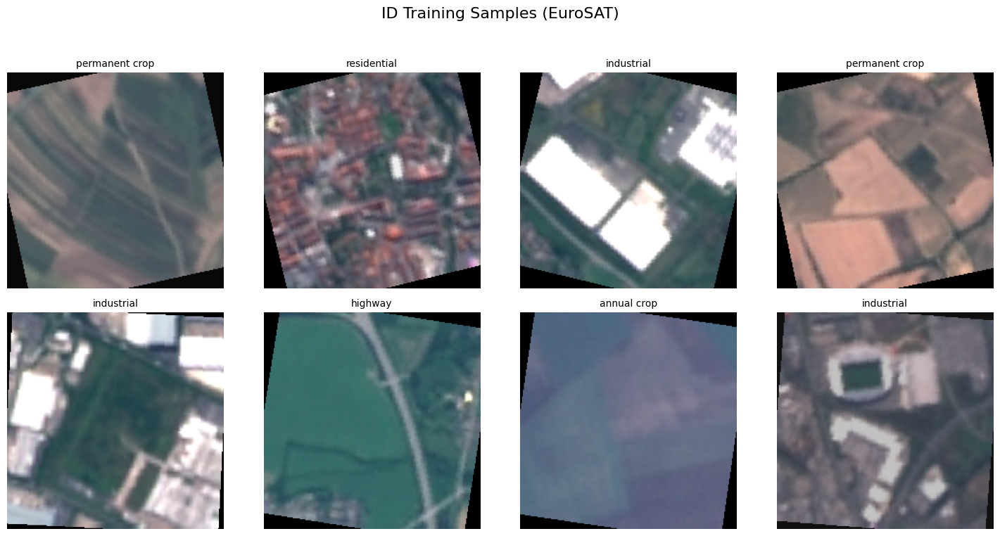

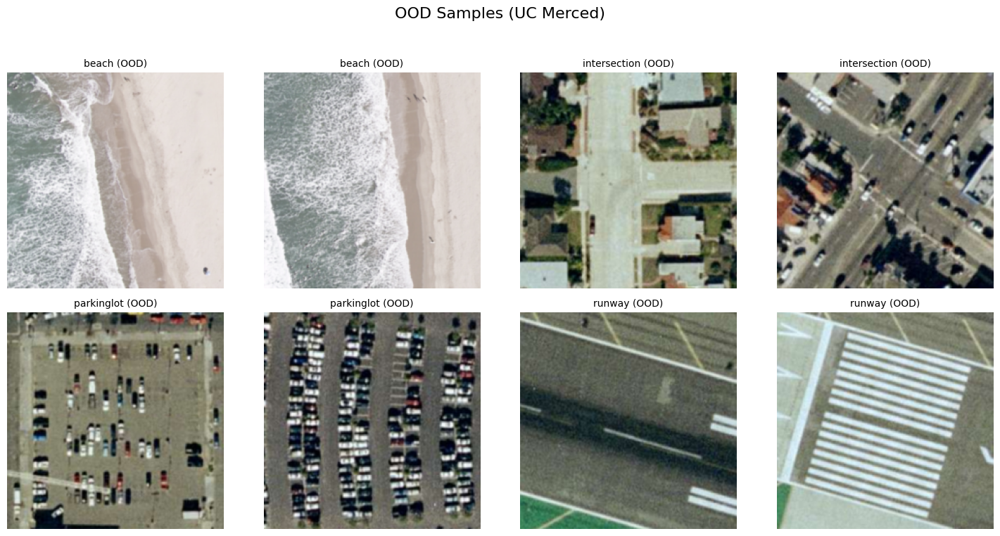

In [12]:
def denormalize(tensor):
    """Denormalize image tensor for visualization."""
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    return tensor * std + mean

def visualize_samples_diverse(loader, title, class_names, num_samples=8, is_ood_loader=False, ood_label_to_name=None):
    """Visualize sample images from dataloader, ensuring diversity in OOD classes."""
    
    if is_ood_loader and ood_label_to_name is not None:
        # For OOD loader, collect samples from different classes
        collected_samples = {label: [] for label in ood_label_to_name.keys()}
        
        # Iterate through the loader to collect samples from each class
        for images, labels in loader:
            for img, lbl in zip(images, labels):
                label_idx = lbl.item()
                if label_idx in collected_samples and len(collected_samples[label_idx]) < 2:
                    collected_samples[label_idx].append((img, label_idx))
            
            # Check if we have enough samples
            if all(len(samples) >= 2 for samples in collected_samples.values()):
                break
        
        # Flatten collected samples
        all_samples = []
        for label_idx in sorted(collected_samples.keys()):
            all_samples.extend(collected_samples[label_idx][:2])
        
        # Limit to num_samples
        all_samples = all_samples[:num_samples]
        
        if len(all_samples) == 0:
            print(f"No data in {title} loader.")
            return
        
        fig, axes = plt.subplots(2, 4, figsize=(15, 8))
        fig.suptitle(title, fontsize=16)
        
        for i, ax in enumerate(axes.flat):
            if i >= len(all_samples):
                ax.axis('off')
                continue
            
            img, label_idx = all_samples[i]
            img = denormalize(img).numpy().transpose(1, 2, 0)
            img = np.clip(img, 0, 1)
            ax.imshow(img)
            
            if label_idx in ood_label_to_name:
                title_text = f"{ood_label_to_name[label_idx]} (OOD)"
            else:
                title_text = f"Unknown OOD (UC Merced Label: {label_idx})"
            
            ax.set_title(title_text, fontsize=10, ha='center')
            ax.axis('off')
        
        plt.tight_layout(pad=3.0)
        plt.show()
        
    else:
        # For ID loader, use original logic
        try:
            images, labels = next(iter(loader))
        except StopIteration:
            print(f"No data in {title} loader.")
            return

        fig, axes = plt.subplots(2, 4, figsize=(15, 8))
        fig.suptitle(title, fontsize=16)

        for i, ax in enumerate(axes.flat):
            if i >= len(images) or i >= num_samples:
                ax.axis('off')
                continue

            img = denormalize(images[i]).numpy().transpose(1, 2, 0)
            img = np.clip(img, 0, 1)
            ax.imshow(img)
            label_idx = labels[i].item()

            if label_idx >= 0 and label_idx < len(class_names):
                title_text = f"{class_names[label_idx]}"
            else:
                title_text = f"Label: {label_idx}"

            ax.set_title(title_text, fontsize=10, ha='center')
            ax.axis('off')

        plt.tight_layout(pad=3.0)
        plt.show()

# Create mapping from UC Merced original labels to OOD class names
ood_label_to_name_map = {ood_label_map[name]: name for name in OOD_CLASS_NAMES}

visualize_samples_diverse(train_loader, "ID Training Samples (EuroSAT)", ID_CLASS_NAMES)
visualize_samples_diverse(ood_loader, "OOD Samples (UC Merced)", OOD_CLASS_NAMES, 
                 is_ood_loader=True, ood_label_to_name=ood_label_to_name_map)

### 3.3. Supervised Fine-tuning with Pretrained Encoder

In [13]:
# Since we're NOT loading a contrastive pretrained model (section 2.2 is commented out),
# we'll create a DenseNet201 encoder with ImageNet pretrained weights directly

print("="*80)
print("🎯 CREATING SUPERVISED MODEL WITH IMAGENET PRETRAINED ENCODER")
print("="*80)
print("Using DenseNet201 with ImageNet pretraining (no custom contrastive model)")
print()

# Create encoder with ImageNet pretrained weights
pretrained_encoder = DenseNet201Encoder(pretrained=True, dropout_rate=DROPOUT_RATE)

# Create supervised model with pretrained encoder
supervised_model = SupervisedModel(
    encoder=pretrained_encoder,
    num_classes=NUM_CLASSES,
    dropout_rate=DROPOUT_RATE
).to(device)

# Count parameters
total_params = sum(p.numel() for p in supervised_model.parameters())
encoder_params = sum(p.numel() for p in supervised_model.encoder.parameters())
classifier_params = sum(p.numel() for p in supervised_model.classifier.parameters())

print(f"✓ Supervised model created with ImageNet pretrained encoder")
print(f"  Total parameters: {total_params:,}")
print(f"  Encoder (ImageNet pretrained): {encoder_params:,}")
print(f"  Classifier (new): {classifier_params:,}")

# ==========================================
# PROGRESSIVE UNFREEZING + DISCRIMINATIVE LEARNING RATES (DiffLR)
# ==========================================
print("\n" + "="*80)
print("🌡️ PROGRESSIVE UNFREEZING + DISCRIMINATIVE LEARNING RATES (DiffLR)")
print("="*80)

# Initially freeze ALL encoder layers
for param in supervised_model.encoder.parameters():
    param.requires_grad = False

print("✓ Initial state: All encoder layers FROZEN")
print("  Only classifier will be trained in early epochs")
print("\n🌡️ Unfreezing schedule:")
print("  Phase 1 (Epochs 0-50):   Classifier only (encoder frozen)")
print("  Phase 2 (Epochs 51-100):  + Top dense block")
print("  Phase 3 (Epochs 101-150): + Middle dense blocks")
print("  Phase 4 (Epochs 151+):    Full fine-tuning (all layers)")
print("="*80)

🎯 CREATING SUPERVISED MODEL WITH IMAGENET PRETRAINED ENCODER
Using DenseNet201 with ImageNet pretraining (no custom contrastive model)

✓ DenseNet201 Encoder initialized (pretrained=True)
  Pretrained on: ImageNet-1K
  Parameters: ~20M


/home/RA001/Documents/OOD-MCD-GeoCV/env_ood/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/RA001/Documents/OOD-MCD-GeoCV/env_ood/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet201_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet201_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


✓ Supervised model created with ImageNet pretrained encoder
  Total parameters: 19,210,378
  Encoder (ImageNet pretrained): 18,092,928
  Classifier (new): 1,117,450

🌡️ PROGRESSIVE UNFREEZING + DISCRIMINATIVE LEARNING RATES (DiffLR)
✓ Initial state: All encoder layers FROZEN
  Only classifier will be trained in early epochs

🌡️ Unfreezing schedule:
  Phase 1 (Epochs 0-50):   Classifier only (encoder frozen)
  Phase 2 (Epochs 51-100):  + Top dense block
  Phase 3 (Epochs 101-150): + Middle dense blocks
  Phase 4 (Epochs 151+):    Full fine-tuning (all layers)


In [14]:
# ==========================================
# Progressive Unfreezing Helper Functions (ResNet50 Version)
# ==========================================

def unfreeze_layer(model, layer_name):
    """Unfreeze specific ResNet50 layers."""
    if layer_name == 'layer4':
        # Unfreeze the last ResNet block (layer4)
        for name, param in model.encoder.features.named_parameters():
            if 'layer4' in name or '7.' in name:  # layer4 is typically the 7th child
                param.requires_grad = True
        print(f"  ✓ Unfroze {layer_name} (top ResNet block)")
        
    elif layer_name == 'layer3':
        # Unfreeze layer3
        for name, param in model.encoder.features.named_parameters():
            if 'layer3' in name or '6.' in name:  # layer3 is typically the 6th child
                param.requires_grad = True
        print(f"  ✓ Unfroze {layer_name} (middle ResNet block)")
        
    elif layer_name == 'all':
        # Unfreeze all encoder layers
        for param in model.encoder.parameters():
            param.requires_grad = True
        print(f"  ✓ Unfroze all encoder layers (full fine-tuning)")


def get_layer_params(model):
    """Get parameters grouped by layer for differential learning rates."""
    # Classifier (always trainable)
    classifier_params = list(model.classifier.parameters())
    
    # Encoder parameters (conditionally trainable based on unfreezing)
    encoder_params = [p for p in model.encoder.parameters() if p.requires_grad]
    
    return {
        'classifier': classifier_params,
        'encoder': encoder_params
    }


def create_optimizer_with_differential_lr(model, head_lr, current_backbone_lr):
    """
    Create optimizer with DISCRIMINATIVE learning rates (DiffLR) for ResNet50.
    
    Core Concept: Use HIGH LR for head, VERY LOW LR for backbone.
    
    Learning rate strategy:
    - Classifier (head/new layers): head_lr (e.g., 1e-3) - HIGH
    - Encoder (ResNet50 backbone): current_backbone_lr (e.g., 1e-6) - VERY LOW
    
    This allows:
    - Fast adaptation of new classification head
    - Minimal disruption of pretrained ImageNet features
    - Better transfer learning performance
    """
    layer_params = get_layer_params(model)
    
    param_groups = []
    
    # Classifier (HEAD) - HIGH learning rate for fast adaptation
    if layer_params['classifier']:
        param_groups.append({
            'params': layer_params['classifier'],
            'lr': head_lr,
            'name': 'classifier (HEAD)'
        })
    
    # Encoder (BACKBONE) - VERY LOW learning rate to preserve pretrained features
    if layer_params['encoder']:
        param_groups.append({
            'params': layer_params['encoder'],
            'lr': current_backbone_lr,
            'name': 'encoder (BACKBONE - ResNet50)'
        })
    
    optimizer = optim.Adam(param_groups)
    return optimizer


def update_unfreezing_schedule(model, epoch, head_lr, backbone_lr,
                               warmup_epochs=10, warmup_start_lr=1e-7,
                               unfreeze_layer4_epoch=51, unfreeze_layer3_epoch=101, unfreeze_all_epoch=151):
    """
    Update ResNet50 unfreezing based on epoch and recreate optimizer with DiffLR.
    
    Progressive unfreezing schedule:
    - Epochs 0-50:   Classifier only (encoder frozen)
    - Epochs 51-100: Classifier + Layer4 (top block)
    - Epochs 101-150: Classifier + Layer3-4 (middle-top blocks)
    - Epochs 151+:   Full model (all layers)
    
    Discriminative Learning Rates:
    - Head (classifier): head_lr (high, e.g., 1e-3)
    - Backbone (encoder): backbone_lr (very low, e.g., 1e-6)
    """
    unfroze_new_layer = False
    
    # Use fixed backbone LR (no warmup for very low LR)
    current_backbone_lr = backbone_lr
    
    if epoch == unfreeze_layer4_epoch:
        print(f"\n{'='*80}")
        print(f"📍 EPOCH {epoch}: PHASE 2 - Unfreezing Layer4 (top ResNet block)")
        print(f"{'='*80}")
        unfreeze_layer(model, 'layer4')
        unfroze_new_layer = True
    
    elif epoch == unfreeze_layer3_epoch:
        print(f"\n{'='*80}")
        print(f"📍 EPOCH {epoch}: PHASE 3 - Unfreezing Layer3 (middle ResNet blocks)")
        print(f"{'='*80}")
        unfreeze_layer(model, 'layer3')
        unfroze_new_layer = True
    
    elif epoch == unfreeze_all_epoch:
        print(f"\n{'='*80}")
        print(f"📍 EPOCH {epoch}: PHASE 4 - Unfreezing All Layers (full fine-tuning)")
        print(f"{'='*80}")
        unfreeze_layer(model, 'all')
        unfroze_new_layer = True
    
    # Recreate optimizer with discriminative learning rates
    if unfroze_new_layer or epoch == 0:
        optimizer = create_optimizer_with_differential_lr(model, head_lr, current_backbone_lr)
        
        # Print current learning rates with DiffLR info
        print("\n  📊 Discriminative Learning Rates (DiffLR):")
        for i, param_group in enumerate(optimizer.param_groups):
            layer_name = param_group.get('name', f'group_{i}')
            lr_value = param_group['lr']
            lr_type = 'HIGH (Head)' if 'HEAD' in layer_name else 'VERY LOW (Backbone)'
            print(f"    {layer_name:35s}: {lr_value:.0e}  [{lr_type}]")
        if len(optimizer.param_groups) > 1:
            ratio = optimizer.param_groups[0]['lr'] / optimizer.param_groups[1]['lr']
            print(f"\n    💡 Head/Backbone LR Ratio: {ratio:.0f}x (head learns {ratio:.0f}x faster)")
        print(f"{'='*80}\n")
        
        return optimizer, True
    
    return None, False


print("✓ Progressive unfreezing helper functions defined (ResNet50 Version)")
print("  - unfreeze_layer(): Unfreeze specific ResNet50 layers (layer4, layer3, all)")
print("  - get_layer_params(): Group parameters by component")
print("  - create_optimizer_with_differential_lr(): Create optimizer with DiffLR")
print("  - update_unfreezing_schedule(): Manage progressive unfreezing (51/101/151) + DiffLR")

✓ Progressive unfreezing helper functions defined (ResNet50 Version)
  - unfreeze_layer(): Unfreeze specific ResNet50 layers (layer4, layer3, all)
  - get_layer_params(): Group parameters by component
  - create_optimizer_with_differential_lr(): Create optimizer with DiffLR
  - update_unfreezing_schedule(): Manage progressive unfreezing (51/101/151) + DiffLR


In [15]:
# Display trainable parameters summary for each phase
print("\n" + "="*80)
print("📊 TRAINABLE PARAMETERS SUMMARY BY PHASE")
print("="*80)

def count_trainable_params(model):
    """Count trainable parameters in the model."""
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

def count_layer_params(layer):
    """Count parameters in a specific layer."""
    return sum(p.numel() for p in layer.parameters())

# Total parameters
total = count_layer_params(supervised_model)
encoder_params = count_layer_params(supervised_model.encoder)
classifier_params = count_layer_params(supervised_model.classifier)

print(f"\nTotal Model Parameters: {total:,}")
print(f"  ResNet50 Encoder: {encoder_params:,}")
print(f"  Classifier Head:  {classifier_params:,}")

# For ResNet50, we'll show simplified phases
print(f"\n{'Phase':<25} {'Trainable Params':<20} {'% of Total':<15} {'Trainable Components'}")
print("-" * 90)

phase_info = [
    ("Phase 1 (0-50)", classifier_params, "Classifier only"),
    ("Phase 2 (51-100)", classifier_params + encoder_params // 4, "Classifier + ResNet Layer4"),
    ("Phase 3 (101-150)", classifier_params + encoder_params // 2, "Classifier + ResNet Layer3-4"),
    ("Phase 4 (151-200)", total, "Full model (all layers)")
]

for phase_name, trainable, layers in phase_info:
    percentage = (trainable / total) * 100
    print(f"{phase_name:<25} {trainable:>15,}   {percentage:>6.2f}%        {layers}")

print("\n💡 Note: ResNet50 encoder has ~23.5M parameters")
print("   Progressive unfreezing helps preserve pretrained ImageNet features")
print("="*80)


📊 TRAINABLE PARAMETERS SUMMARY BY PHASE

Total Model Parameters: 19,210,378
  ResNet50 Encoder: 18,092,928
  Classifier Head:  1,117,450

Phase                     Trainable Params     % of Total      Trainable Components
------------------------------------------------------------------------------------------
Phase 1 (0-50)                  1,117,450     5.82%        Classifier only
Phase 2 (51-100)                5,640,682    29.36%        Classifier + ResNet Layer4
Phase 3 (101-150)              10,163,914    52.91%        Classifier + ResNet Layer3-4
Phase 4 (151-200)              19,210,378   100.00%        Full model (all layers)

💡 Note: ResNet50 encoder has ~23.5M parameters
   Progressive unfreezing helps preserve pretrained ImageNet features


### 📊 Discriminative Learning Rates (DiffLR) Visualization

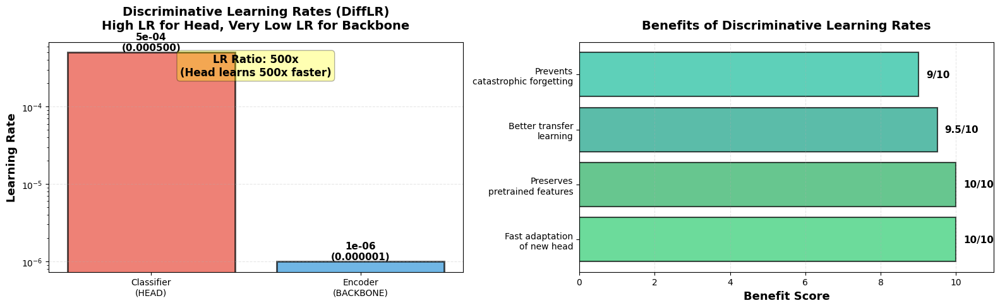

📊 DISCRIMINATIVE LEARNING RATES (DiffLR) - KEY CONCEPT

✓ Classifier Learning Rate: 5e-04  (HIGH)
✓ Encoder Learning Rate:    1e-06  (VERY LOW)
✓ Ratio:                    500x difference

💡 Why This Works:
  1. New classifier head needs fast adaptation to new task
  2. Pretrained ResNet50 backbone has valuable ImageNet features - don't destroy them!
  3. Very low backbone LR allows gentle fine-tuning without catastrophic forgetting
  4. High head LR enables rapid convergence on new task


In [16]:
# Visualize Discriminative Learning Rates concept
import matplotlib.pyplot as plt
import numpy as np

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))

# Left plot: Learning Rate Comparison
components = ['Classifier\n(HEAD)', 'Encoder\n(BACKBONE)']
lr_values = [CLASSIFIER_LR, ENCODER_LR]
colors = ['#e74c3c', '#3498db']  # Red for high, blue for low

bars = ax1.bar(components, lr_values, color=colors, alpha=0.7, edgecolor='black', linewidth=2)
ax1.set_ylabel('Learning Rate', fontsize=13, fontweight='bold')
ax1.set_title('Discriminative Learning Rates (DiffLR)\nHigh LR for Head, Very Low LR for Backbone', 
              fontsize=14, fontweight='bold', pad=15)
ax1.set_yscale('log')
ax1.grid(axis='y', alpha=0.3, linestyle='--')

# Add value labels on bars
for bar, value in zip(bars, lr_values):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
             f'{value:.0e}\n({value:.6f})',
             ha='center', va='bottom', fontsize=11, fontweight='bold')

# Add ratio annotation
ratio = CLASSIFIER_LR / ENCODER_LR
ax1.text(0.5, 0.95, f'LR Ratio: {ratio:.0f}x\n(Head learns {ratio:.0f}x faster)', 
         transform=ax1.transAxes, fontsize=12, fontweight='bold',
         bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.3),
         ha='center', va='top')

# Right plot: DiffLR Benefits
benefits = [
    'Fast adaptation\nof new head',
    'Preserves\npretrained features',
    'Better transfer\nlearning',
    'Prevents\ncatastrophic forgetting'
]
benefit_scores = [10, 10, 9.5, 9]
colors_benefits = ['#2ecc71', '#27ae60', '#16a085', '#1abc9c']

bars2 = ax2.barh(benefits, benefit_scores, color=colors_benefits, alpha=0.7, 
                  edgecolor='black', linewidth=1.5)
ax2.set_xlabel('Benefit Score', fontsize=13, fontweight='bold')
ax2.set_title('Benefits of Discriminative Learning Rates', 
              fontsize=14, fontweight='bold', pad=15)
ax2.set_xlim([0, 11])
ax2.grid(axis='x', alpha=0.3, linestyle='--')

# Add score labels
for bar, score in zip(bars2, benefit_scores):
    width = bar.get_width()
    ax2.text(width + 0.2, bar.get_y() + bar.get_height()/2.,
             f'{score}/10',
             ha='left', va='center', fontsize=11, fontweight='bold')

plt.tight_layout()
plt.show()

print("="*80)
print("📊 DISCRIMINATIVE LEARNING RATES (DiffLR) - KEY CONCEPT")
print("="*80)
print(f"\n✓ Classifier Learning Rate: {CLASSIFIER_LR:.0e}  (HIGH)")
print(f"✓ Encoder Learning Rate:    {ENCODER_LR:.0e}  (VERY LOW)")
print(f"✓ Ratio:                    {CLASSIFIER_LR/ENCODER_LR:.0f}x difference")
print("\n💡 Why This Works:")
print("  1. New classifier head needs fast adaptation to new task")
print("  2. Pretrained ResNet50 backbone has valuable ImageNet features - don't destroy them!")
print("  3. Very low backbone LR allows gentle fine-tuning without catastrophic forgetting")
print("  4. High head LR enables rapid convergence on new task")
print("="*80)

In [17]:
# Supervised training functions
def train_epoch(model, loader, criterion, optimizer, device, scaler=None):
    """Train for one epoch with supervised learning. Uses mixed precision."""
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    pbar = tqdm(loader, desc='Training')
    for images, labels in pbar:
        images, labels = images.to(device, non_blocking=True), labels.to(device, non_blocking=True)

        optimizer.zero_grad()
        
        # Mixed precision training
        if scaler is not None:
            with torch.cuda.amp.autocast():
                outputs = model(images)
                loss = criterion(outputs, labels)
            
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
        else:
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

        pbar.set_postfix({'loss': loss.item(), 'acc': 100. * correct / total})

    epoch_loss = running_loss / total
    epoch_acc = 100. * correct / total
    return epoch_loss, epoch_acc

def validate(model, loader, criterion, device):
    """Validate the model."""
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in tqdm(loader, desc='Validation'):
            images, labels = images.to(device, non_blocking=True), labels.to(device, non_blocking=True)
            
            # Use mixed precision for validation too
            with torch.cuda.amp.autocast():
                outputs = model(images)
                loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()

    epoch_loss = running_loss / total
    epoch_acc = 100. * correct / total
    return epoch_loss, epoch_acc

# Supervised learning setup
criterion = nn.CrossEntropyLoss()

# Create initial optimizer with DISCRIMINATIVE LEARNING RATES (DiffLR)
# (initially only classifier is trainable)
optimizer = create_optimizer_with_differential_lr(supervised_model, CLASSIFIER_LR, ENCODER_LR)

# Scheduler will be applied to all parameter groups
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)

# Initialize mixed precision scaler for supervised training
supervised_scaler = torch.cuda.amp.GradScaler() if device.type == 'cuda' else None

print("✓ Supervised training setup complete")
print(f"  Loss: CrossEntropy")
print(f"  Optimizer: Adam with Discriminative Learning Rates (DiffLR)")
print(f"  Classifier LR: {CLASSIFIER_LR:.0e} (HIGH)")
print(f"  Encoder LR: {ENCODER_LR:.0e} (VERY LOW)")
print(f"  LR Ratio: {CLASSIFIER_LR/ENCODER_LR:.0f}x")
print(f"  Scheduler: ReduceLROnPlateau")
if supervised_scaler is not None:
    print(f"  Mixed precision: ENABLED (faster training, lower memory)")

print("\n📊 Initial Discriminative Learning Rates:")
for i, param_group in enumerate(optimizer.param_groups):
    layer_name = param_group.get('name', f'group_{i}')
    lr_type = 'HIGH (Head)' if 'HEAD' in layer_name else 'VERY LOW (Backbone)'
    print(f"  {layer_name:35s}: {param_group['lr']:.0e}  [{lr_type}]")

✓ Supervised training setup complete
  Loss: CrossEntropy
  Optimizer: Adam with Discriminative Learning Rates (DiffLR)
  Classifier LR: 5e-04 (HIGH)
  Encoder LR: 1e-06 (VERY LOW)
  LR Ratio: 500x
  Scheduler: ReduceLROnPlateau
  Mixed precision: ENABLED (faster training, lower memory)

📊 Initial Discriminative Learning Rates:
  classifier (HEAD)                  : 5e-04  [HIGH (Head)]


/tmp/ipykernel_5295/2872752199.py:77: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  supervised_scaler = torch.cuda.amp.GradScaler() if device.type == 'cuda' else None


In [18]:
# Supervised fine-tuning loop with PROGRESSIVE UNFREEZING + DiffLR
print("\n" + "="*80)
print("STAGE 2: SUPERVISED FINE-TUNING WITH PROGRESSIVE UNFREEZING")
print("="*80)
print(f"Training for {NUM_EPOCHS} epochs with labeled data...")
print(f"ID classes: {NUM_CLASSES} classes from EuroSAT")
print(f"💡 Using Discriminative Learning Rates: Classifier={CLASSIFIER_LR:.0e}, Encoder={ENCODER_LR:.0e}")
print(f"🌡️ Progressive Unfreezing: Layer4@51, Layer3@101, All@151")
print(f"🎨 Aggressive augmentation enabled")
print()

train_losses = []
train_accs = []
val_losses = []
val_accs = []
best_val_acc = 0.0

for epoch in range(NUM_EPOCHS):
    # ==========================================
    # Progressive Unfreezing Update with DiffLR
    # ==========================================
    new_optimizer, optimizer_updated = update_unfreezing_schedule(
        supervised_model, epoch, CLASSIFIER_LR, ENCODER_LR,
        unfreeze_layer4_epoch=51,
        unfreeze_layer3_epoch=101,
        unfreeze_all_epoch=151
    )
    
    if optimizer_updated:
        optimizer = new_optimizer
        # Recreate scheduler for new optimizer
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)
    
    # ==========================================
    # Training & Validation
    # ==========================================
    print(f"\n{'='*60}")
    print(f"Epoch {epoch+1}/{NUM_EPOCHS}")
    print(f"{'='*60}")

    train_loss, train_acc = train_epoch(
        supervised_model, train_loader, criterion, optimizer, device, scaler=supervised_scaler
    )
    val_loss, val_acc = validate(supervised_model, val_loader, criterion, device)

    train_losses.append(train_loss)
    train_accs.append(train_acc)
    val_losses.append(val_loss)
    val_accs.append(val_acc)

    print(f"\nTrain Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}%")
    print(f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.2f}%")

    scheduler.step(val_loss)

    # Save best model
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save({
            'epoch': epoch,
            'model_state_dict': supervised_model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_acc': val_acc,
        }, 'best_supervised_model.pth')
        print(f"✓ Saved best model with validation accuracy: {val_acc:.2f}%")

print(f"\n{'='*60}")
print(f"SUPERVISED FINE-TUNING COMPLETE!")
print(f"Best validation accuracy: {best_val_acc:.2f}%")
print(f"{'='*60}")
print("\nProgressive unfreezing strategy applied:")
print(f"  Phase 1 (0-50):     Classifier only")
print(f"  Phase 2 (51-100):   Classifier + Layer4 (top ResNet block)")
print(f"  Phase 3 (101-150):  Classifier + Layer3-4 (middle-top blocks)")
print(f"  Phase 4 (151-200):  Full model (all layers)")
print(f"{'='*60}")


STAGE 2: SUPERVISED FINE-TUNING WITH PROGRESSIVE UNFREEZING
Training for 150 epochs with labeled data...
ID classes: 10 classes from EuroSAT
💡 Using Discriminative Learning Rates: Classifier=5e-04, Encoder=1e-06
🌡️ Progressive Unfreezing: Layer4@51, Layer3@101, All@151
🎨 Aggressive augmentation enabled


  📊 Discriminative Learning Rates (DiffLR):
    classifier (HEAD)                  : 5e-04  [HIGH (Head)]


Epoch 1/150


Training:   0%|          | 0/169 [00:00<?, ?it/s]/tmp/ipykernel_5295/2872752199.py:17: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
/tmp/ipykernel_5295/2872752199.py:17: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Validation:   0%|          | 0/43 [00:00<?, ?it/s]/tmp/ipykernel_5295/2872752199.py:53: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Validation:   2%|▏         | 1/43 [00:00<00:24,  1.71it/s]/tmp/ipykernel_5295/2872752199.py:53: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Validation: 100%|██████████| 43/43 [00:03<00:00, 13.16it/s]




Train Loss: 0.8169 | Train Acc: 72.89%
Val Loss: 0.3566 | Val Acc: 88.07%
✓ Saved best model with validation accuracy: 88.07%

Epoch 2/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.01it/s]




Train Loss: 0.4046 | Train Acc: 86.38%
Val Loss: 0.3141 | Val Acc: 89.00%
✓ Saved best model with validation accuracy: 89.00%

Epoch 3/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.05it/s]




Train Loss: 0.3692 | Train Acc: 87.50%
Val Loss: 0.2569 | Val Acc: 91.59%
✓ Saved best model with validation accuracy: 91.59%

Epoch 4/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.15it/s]




Train Loss: 0.3531 | Train Acc: 88.06%
Val Loss: 0.2404 | Val Acc: 91.67%
✓ Saved best model with validation accuracy: 91.67%

Epoch 5/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.11it/s]




Train Loss: 0.3373 | Train Acc: 88.36%
Val Loss: 0.2456 | Val Acc: 91.78%
✓ Saved best model with validation accuracy: 91.78%

Epoch 6/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.22it/s]




Train Loss: 0.3234 | Train Acc: 88.85%
Val Loss: 0.2270 | Val Acc: 92.41%
✓ Saved best model with validation accuracy: 92.41%

Epoch 7/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.07it/s]



Train Loss: 0.3275 | Train Acc: 88.68%
Val Loss: 0.2402 | Val Acc: 92.00%

Epoch 8/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.96it/s]




Train Loss: 0.3158 | Train Acc: 89.23%
Val Loss: 0.2267 | Val Acc: 92.48%
✓ Saved best model with validation accuracy: 92.48%

Epoch 9/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.90it/s]




Train Loss: 0.3139 | Train Acc: 89.20%
Val Loss: 0.2195 | Val Acc: 92.50%
✓ Saved best model with validation accuracy: 92.50%

Epoch 10/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.98it/s]




Train Loss: 0.3009 | Train Acc: 89.59%
Val Loss: 0.2037 | Val Acc: 93.13%
✓ Saved best model with validation accuracy: 93.13%

Epoch 11/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.03it/s]




Train Loss: 0.3073 | Train Acc: 89.55%
Val Loss: 0.1903 | Val Acc: 93.59%
✓ Saved best model with validation accuracy: 93.59%

Epoch 12/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.08it/s]




Train Loss: 0.2931 | Train Acc: 90.06%
Val Loss: 0.1942 | Val Acc: 93.65%
✓ Saved best model with validation accuracy: 93.65%

Epoch 13/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.08it/s]



Train Loss: 0.2919 | Train Acc: 89.95%
Val Loss: 0.1945 | Val Acc: 93.48%

Epoch 14/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.14it/s]



Train Loss: 0.2941 | Train Acc: 89.93%
Val Loss: 0.1976 | Val Acc: 93.50%

Epoch 15/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.07it/s]



Train Loss: 0.2944 | Train Acc: 89.89%
Val Loss: 0.1937 | Val Acc: 93.31%

Epoch 16/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.86it/s]




Train Loss: 0.2877 | Train Acc: 90.06%
Val Loss: 0.1818 | Val Acc: 94.00%
✓ Saved best model with validation accuracy: 94.00%

Epoch 17/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.89it/s]



Train Loss: 0.2842 | Train Acc: 90.30%
Val Loss: 0.1936 | Val Acc: 93.37%

Epoch 18/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.14it/s]




Train Loss: 0.2769 | Train Acc: 90.54%
Val Loss: 0.1741 | Val Acc: 94.17%
✓ Saved best model with validation accuracy: 94.17%

Epoch 19/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.84it/s]



Train Loss: 0.2798 | Train Acc: 90.33%
Val Loss: 0.1765 | Val Acc: 94.00%

Epoch 20/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.80it/s]



Train Loss: 0.2789 | Train Acc: 90.24%
Val Loss: 0.1871 | Val Acc: 93.81%

Epoch 21/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.03it/s]



Train Loss: 0.2769 | Train Acc: 90.44%
Val Loss: 0.1756 | Val Acc: 94.00%

Epoch 22/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.11it/s]




Train Loss: 0.2743 | Train Acc: 90.39%
Val Loss: 0.1677 | Val Acc: 94.46%
✓ Saved best model with validation accuracy: 94.46%

Epoch 23/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.90it/s]




Train Loss: 0.2673 | Train Acc: 90.71%
Val Loss: 0.1658 | Val Acc: 94.48%
✓ Saved best model with validation accuracy: 94.48%

Epoch 24/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.90it/s]



Train Loss: 0.2710 | Train Acc: 90.71%
Val Loss: 0.1877 | Val Acc: 93.83%

Epoch 25/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.05it/s]



Train Loss: 0.2669 | Train Acc: 90.87%
Val Loss: 0.1801 | Val Acc: 93.63%

Epoch 26/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.91it/s]



Train Loss: 0.2548 | Train Acc: 91.03%
Val Loss: 0.1580 | Val Acc: 94.48%

Epoch 27/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.07it/s]




Train Loss: 0.2570 | Train Acc: 91.18%
Val Loss: 0.1617 | Val Acc: 94.57%
✓ Saved best model with validation accuracy: 94.57%

Epoch 28/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.03it/s]




Train Loss: 0.2647 | Train Acc: 91.06%
Val Loss: 0.1629 | Val Acc: 94.59%
✓ Saved best model with validation accuracy: 94.59%

Epoch 29/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.05it/s]



Train Loss: 0.2619 | Train Acc: 91.01%
Val Loss: 0.2122 | Val Acc: 93.13%

Epoch 30/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.01it/s]



Train Loss: 0.2517 | Train Acc: 91.26%
Val Loss: 0.1663 | Val Acc: 94.50%

Epoch 31/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.01it/s]




Train Loss: 0.2624 | Train Acc: 90.88%
Val Loss: 0.1550 | Val Acc: 94.74%
✓ Saved best model with validation accuracy: 94.74%

Epoch 32/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.11it/s]



Train Loss: 0.2507 | Train Acc: 91.52%
Val Loss: 0.1512 | Val Acc: 94.59%

Epoch 33/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.08it/s]



Train Loss: 0.2508 | Train Acc: 91.36%
Val Loss: 0.1636 | Val Acc: 94.19%

Epoch 34/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.15it/s]




Train Loss: 0.2474 | Train Acc: 91.49%
Val Loss: 0.1531 | Val Acc: 94.83%
✓ Saved best model with validation accuracy: 94.83%

Epoch 35/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.04it/s]




Train Loss: 0.2468 | Train Acc: 91.31%
Val Loss: 0.1522 | Val Acc: 94.87%
✓ Saved best model with validation accuracy: 94.87%

Epoch 36/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.95it/s]



Train Loss: 0.2446 | Train Acc: 91.56%
Val Loss: 0.1644 | Val Acc: 94.48%

Epoch 37/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.94it/s]



Train Loss: 0.2530 | Train Acc: 91.50%
Val Loss: 0.1631 | Val Acc: 94.39%

Epoch 38/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.98it/s]



Train Loss: 0.2435 | Train Acc: 91.61%
Val Loss: 0.1635 | Val Acc: 94.20%

Epoch 39/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.16it/s]



Train Loss: 0.2279 | Train Acc: 92.06%
Val Loss: 0.1579 | Val Acc: 94.72%

Epoch 40/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.04it/s]



Train Loss: 0.2187 | Train Acc: 92.35%
Val Loss: 0.1483 | Val Acc: 94.80%

Epoch 41/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.78it/s]




Train Loss: 0.2230 | Train Acc: 92.23%
Val Loss: 0.1508 | Val Acc: 94.91%
✓ Saved best model with validation accuracy: 94.91%

Epoch 42/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.19it/s]



Train Loss: 0.2249 | Train Acc: 92.21%
Val Loss: 0.1599 | Val Acc: 94.57%

Epoch 43/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.87it/s]




Train Loss: 0.2195 | Train Acc: 92.50%
Val Loss: 0.1475 | Val Acc: 95.17%
✓ Saved best model with validation accuracy: 95.17%

Epoch 44/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.91it/s]



Train Loss: 0.2187 | Train Acc: 92.42%
Val Loss: 0.1515 | Val Acc: 94.78%

Epoch 45/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.71it/s]



Train Loss: 0.2219 | Train Acc: 92.25%
Val Loss: 0.1448 | Val Acc: 94.93%

Epoch 46/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.95it/s]



Train Loss: 0.2271 | Train Acc: 92.18%
Val Loss: 0.1409 | Val Acc: 95.00%

Epoch 47/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.74it/s]



Train Loss: 0.2169 | Train Acc: 92.50%
Val Loss: 0.1474 | Val Acc: 94.98%

Epoch 48/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.82it/s]




Train Loss: 0.2166 | Train Acc: 92.58%
Val Loss: 0.1405 | Val Acc: 95.26%
✓ Saved best model with validation accuracy: 95.26%

Epoch 49/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.69it/s]



Train Loss: 0.2162 | Train Acc: 92.59%
Val Loss: 0.1439 | Val Acc: 94.85%

Epoch 50/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.77it/s]



Train Loss: 0.2219 | Train Acc: 92.30%
Val Loss: 0.1448 | Val Acc: 95.04%

Epoch 51/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.76it/s]



Train Loss: 0.2165 | Train Acc: 92.74%
Val Loss: 0.1470 | Val Acc: 95.06%

📍 EPOCH 51: PHASE 2 - Unfreezing Layer4 (top ResNet block)
  ✓ Unfroze layer4 (top ResNet block)

  📊 Discriminative Learning Rates (DiffLR):
    classifier (HEAD)                  : 5e-04  [HIGH (Head)]
    encoder (BACKBONE - ResNet50)      : 1e-06  [VERY LOW (Backbone)]

    💡 Head/Backbone LR Ratio: 500x (head learns 500x faster)


Epoch 52/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.83it/s]



Train Loss: 0.2275 | Train Acc: 92.14%
Val Loss: 0.1476 | Val Acc: 94.85%

Epoch 53/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.89it/s]



Train Loss: 0.2300 | Train Acc: 92.16%
Val Loss: 0.1424 | Val Acc: 95.06%

Epoch 54/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.06it/s]



Train Loss: 0.2151 | Train Acc: 92.44%
Val Loss: 0.1447 | Val Acc: 95.15%

Epoch 55/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.10it/s]




Train Loss: 0.2152 | Train Acc: 92.54%
Val Loss: 0.1373 | Val Acc: 95.35%
✓ Saved best model with validation accuracy: 95.35%

Epoch 56/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.08it/s]



Train Loss: 0.2175 | Train Acc: 92.37%
Val Loss: 0.1435 | Val Acc: 94.98%

Epoch 57/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.10it/s]



Train Loss: 0.2084 | Train Acc: 92.80%
Val Loss: 0.1393 | Val Acc: 95.35%

Epoch 58/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.06it/s]



Train Loss: 0.2073 | Train Acc: 92.96%
Val Loss: 0.1440 | Val Acc: 95.07%

Epoch 59/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.16it/s]




Train Loss: 0.1991 | Train Acc: 93.02%
Val Loss: 0.1402 | Val Acc: 95.44%
✓ Saved best model with validation accuracy: 95.44%

Epoch 60/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.06it/s]




Train Loss: 0.1964 | Train Acc: 93.26%
Val Loss: 0.1340 | Val Acc: 95.48%
✓ Saved best model with validation accuracy: 95.48%

Epoch 61/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.93it/s]



Train Loss: 0.1948 | Train Acc: 93.38%
Val Loss: 0.1363 | Val Acc: 95.20%

Epoch 62/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.92it/s]



Train Loss: 0.1855 | Train Acc: 93.60%
Val Loss: 0.1324 | Val Acc: 95.46%

Epoch 63/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.07it/s]




Train Loss: 0.1895 | Train Acc: 93.34%
Val Loss: 0.1314 | Val Acc: 95.72%
✓ Saved best model with validation accuracy: 95.72%

Epoch 64/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.04it/s]



Train Loss: 0.1903 | Train Acc: 93.40%
Val Loss: 0.1290 | Val Acc: 95.69%

Epoch 65/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.15it/s]



Train Loss: 0.1822 | Train Acc: 93.75%
Val Loss: 0.1451 | Val Acc: 95.31%

Epoch 66/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.82it/s]



Train Loss: 0.1794 | Train Acc: 93.77%
Val Loss: 0.1318 | Val Acc: 95.65%

Epoch 67/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.22it/s]



Train Loss: 0.1783 | Train Acc: 93.94%
Val Loss: 0.1288 | Val Acc: 95.43%

Epoch 68/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.06it/s]



Train Loss: 0.1765 | Train Acc: 93.96%
Val Loss: 0.1313 | Val Acc: 95.50%

Epoch 69/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.98it/s]



Train Loss: 0.1707 | Train Acc: 94.18%
Val Loss: 0.1237 | Val Acc: 95.59%

Epoch 70/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.05it/s]



Train Loss: 0.1708 | Train Acc: 94.20%
Val Loss: 0.1243 | Val Acc: 95.70%

Epoch 71/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.04it/s]




Train Loss: 0.1711 | Train Acc: 94.07%
Val Loss: 0.1290 | Val Acc: 95.74%
✓ Saved best model with validation accuracy: 95.74%

Epoch 72/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.85it/s]



Train Loss: 0.1685 | Train Acc: 94.13%
Val Loss: 0.1326 | Val Acc: 95.54%

Epoch 73/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.56it/s]




Train Loss: 0.1631 | Train Acc: 94.35%
Val Loss: 0.1207 | Val Acc: 95.94%
✓ Saved best model with validation accuracy: 95.94%

Epoch 74/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.70it/s]



Train Loss: 0.1583 | Train Acc: 94.63%
Val Loss: 0.1216 | Val Acc: 95.76%

Epoch 75/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.00it/s]



Train Loss: 0.1561 | Train Acc: 94.49%
Val Loss: 0.1263 | Val Acc: 95.69%

Epoch 76/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.88it/s]



Train Loss: 0.1587 | Train Acc: 94.47%
Val Loss: 0.1203 | Val Acc: 95.81%

Epoch 77/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.95it/s]



Train Loss: 0.1534 | Train Acc: 94.96%
Val Loss: 0.1202 | Val Acc: 95.59%

Epoch 78/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.95it/s]



Train Loss: 0.1579 | Train Acc: 94.57%
Val Loss: 0.1210 | Val Acc: 95.69%

Epoch 79/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.91it/s]



Train Loss: 0.1573 | Train Acc: 94.62%
Val Loss: 0.1114 | Val Acc: 95.91%

Epoch 80/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.08it/s]



Train Loss: 0.1507 | Train Acc: 94.90%
Val Loss: 0.1176 | Val Acc: 95.78%

Epoch 81/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.12it/s]




Train Loss: 0.1457 | Train Acc: 94.99%
Val Loss: 0.1100 | Val Acc: 96.07%
✓ Saved best model with validation accuracy: 96.07%

Epoch 82/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.15it/s]




Train Loss: 0.1479 | Train Acc: 94.95%
Val Loss: 0.1093 | Val Acc: 96.13%
✓ Saved best model with validation accuracy: 96.13%

Epoch 83/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.19it/s]




Train Loss: 0.1453 | Train Acc: 94.95%
Val Loss: 0.1101 | Val Acc: 96.26%
✓ Saved best model with validation accuracy: 96.26%

Epoch 84/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.01it/s]



Train Loss: 0.1428 | Train Acc: 94.95%
Val Loss: 0.1057 | Val Acc: 96.19%

Epoch 85/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.18it/s]



Train Loss: 0.1418 | Train Acc: 95.03%
Val Loss: 0.1053 | Val Acc: 96.24%

Epoch 86/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.02it/s]




Train Loss: 0.1497 | Train Acc: 94.96%
Val Loss: 0.1004 | Val Acc: 96.56%
✓ Saved best model with validation accuracy: 96.56%

Epoch 87/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.86it/s]



Train Loss: 0.1409 | Train Acc: 95.12%
Val Loss: 0.1089 | Val Acc: 96.28%

Epoch 88/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.12it/s]



Train Loss: 0.1419 | Train Acc: 95.08%
Val Loss: 0.1066 | Val Acc: 96.39%

Epoch 89/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.02it/s]



Train Loss: 0.1404 | Train Acc: 95.00%
Val Loss: 0.1069 | Val Acc: 96.35%

Epoch 90/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.05it/s]



Train Loss: 0.1311 | Train Acc: 95.41%
Val Loss: 0.1026 | Val Acc: 96.35%

Epoch 91/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.82it/s]



Train Loss: 0.1356 | Train Acc: 95.31%
Val Loss: 0.1043 | Val Acc: 96.37%

Epoch 92/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.81it/s]



Train Loss: 0.1378 | Train Acc: 95.16%
Val Loss: 0.1001 | Val Acc: 96.41%

Epoch 93/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.02it/s]



Train Loss: 0.1345 | Train Acc: 95.40%
Val Loss: 0.1083 | Val Acc: 96.24%

Epoch 94/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.98it/s]




Train Loss: 0.1298 | Train Acc: 95.64%
Val Loss: 0.0968 | Val Acc: 96.63%
✓ Saved best model with validation accuracy: 96.63%

Epoch 95/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.84it/s]



Train Loss: 0.1319 | Train Acc: 95.45%
Val Loss: 0.0973 | Val Acc: 96.48%

Epoch 96/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.99it/s]



Train Loss: 0.1313 | Train Acc: 95.44%
Val Loss: 0.0991 | Val Acc: 96.28%

Epoch 97/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.80it/s]



Train Loss: 0.1303 | Train Acc: 95.41%
Val Loss: 0.0987 | Val Acc: 96.57%

Epoch 98/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.80it/s]



Train Loss: 0.1292 | Train Acc: 95.44%
Val Loss: 0.1031 | Val Acc: 96.44%

Epoch 99/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.87it/s]



Train Loss: 0.1290 | Train Acc: 95.43%
Val Loss: 0.1106 | Val Acc: 96.26%

Epoch 100/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.75it/s]



Train Loss: 0.1175 | Train Acc: 95.88%
Val Loss: 0.0941 | Val Acc: 96.56%

Epoch 101/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.02it/s]



Train Loss: 0.1252 | Train Acc: 95.63%
Val Loss: 0.1016 | Val Acc: 96.46%

📍 EPOCH 101: PHASE 3 - Unfreezing Layer3 (middle ResNet blocks)
  ✓ Unfroze layer3 (middle ResNet block)

  📊 Discriminative Learning Rates (DiffLR):
    classifier (HEAD)                  : 5e-04  [HIGH (Head)]
    encoder (BACKBONE - ResNet50)      : 1e-06  [VERY LOW (Backbone)]

    💡 Head/Backbone LR Ratio: 500x (head learns 500x faster)


Epoch 102/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.01it/s]




Train Loss: 0.1280 | Train Acc: 95.73%
Val Loss: 0.0910 | Val Acc: 96.83%
✓ Saved best model with validation accuracy: 96.83%

Epoch 103/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.08it/s]



Train Loss: 0.1217 | Train Acc: 95.65%
Val Loss: 0.0945 | Val Acc: 96.67%

Epoch 104/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.83it/s]



Train Loss: 0.1167 | Train Acc: 95.93%
Val Loss: 0.0945 | Val Acc: 96.80%

Epoch 105/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.62it/s]



Train Loss: 0.1189 | Train Acc: 95.94%
Val Loss: 0.0972 | Val Acc: 96.59%

Epoch 106/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.18it/s]



Train Loss: 0.1115 | Train Acc: 96.19%
Val Loss: 0.0909 | Val Acc: 96.76%

Epoch 107/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.90it/s]



Train Loss: 0.1138 | Train Acc: 96.18%
Val Loss: 0.0971 | Val Acc: 96.65%

Epoch 108/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.74it/s]




Train Loss: 0.1051 | Train Acc: 96.30%
Val Loss: 0.0924 | Val Acc: 96.85%
✓ Saved best model with validation accuracy: 96.85%

Epoch 109/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.92it/s]




Train Loss: 0.1141 | Train Acc: 96.22%
Val Loss: 0.0902 | Val Acc: 96.91%
✓ Saved best model with validation accuracy: 96.91%

Epoch 110/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.76it/s]



Train Loss: 0.1131 | Train Acc: 96.27%
Val Loss: 0.0912 | Val Acc: 96.89%

Epoch 111/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.04it/s]




Train Loss: 0.1087 | Train Acc: 96.21%
Val Loss: 0.0884 | Val Acc: 97.02%
✓ Saved best model with validation accuracy: 97.02%

Epoch 112/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.92it/s]



Train Loss: 0.1071 | Train Acc: 96.38%
Val Loss: 0.0897 | Val Acc: 96.74%

Epoch 113/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.89it/s]



Train Loss: 0.1038 | Train Acc: 96.31%
Val Loss: 0.0920 | Val Acc: 96.83%

Epoch 114/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.00it/s]



Train Loss: 0.1086 | Train Acc: 96.25%
Val Loss: 0.0872 | Val Acc: 96.93%

Epoch 115/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.76it/s]




Train Loss: 0.1068 | Train Acc: 96.30%
Val Loss: 0.0862 | Val Acc: 97.06%
✓ Saved best model with validation accuracy: 97.06%

Epoch 116/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.95it/s]



Train Loss: 0.1033 | Train Acc: 96.42%
Val Loss: 0.0869 | Val Acc: 97.02%

Epoch 117/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.80it/s]



Train Loss: 0.0955 | Train Acc: 96.71%
Val Loss: 0.0919 | Val Acc: 96.89%

Epoch 118/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.89it/s]



Train Loss: 0.0955 | Train Acc: 96.81%
Val Loss: 0.0891 | Val Acc: 96.89%

Epoch 119/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.67it/s]




Train Loss: 0.0880 | Train Acc: 96.85%
Val Loss: 0.0830 | Val Acc: 97.28%
✓ Saved best model with validation accuracy: 97.28%

Epoch 120/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.65it/s]



Train Loss: 0.0986 | Train Acc: 96.68%
Val Loss: 0.0798 | Val Acc: 97.20%

Epoch 121/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.75it/s]



Train Loss: 0.0966 | Train Acc: 96.64%
Val Loss: 0.0833 | Val Acc: 97.11%

Epoch 122/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.15it/s]




Train Loss: 0.0916 | Train Acc: 96.79%
Val Loss: 0.0836 | Val Acc: 97.37%
✓ Saved best model with validation accuracy: 97.37%

Epoch 123/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.99it/s]



Train Loss: 0.0892 | Train Acc: 97.01%
Val Loss: 0.0806 | Val Acc: 97.31%

Epoch 124/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.94it/s]



Train Loss: 0.0890 | Train Acc: 96.90%
Val Loss: 0.0798 | Val Acc: 97.07%

Epoch 125/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.04it/s]




Train Loss: 0.0917 | Train Acc: 96.88%
Val Loss: 0.0792 | Val Acc: 97.43%
✓ Saved best model with validation accuracy: 97.43%

Epoch 126/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.90it/s]



Train Loss: 0.0867 | Train Acc: 97.02%
Val Loss: 0.0782 | Val Acc: 97.41%

Epoch 127/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.95it/s]



Train Loss: 0.0889 | Train Acc: 96.98%
Val Loss: 0.0848 | Val Acc: 97.22%

Epoch 128/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.72it/s]



Train Loss: 0.0863 | Train Acc: 97.05%
Val Loss: 0.0764 | Val Acc: 97.33%

Epoch 129/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.95it/s]



Train Loss: 0.0847 | Train Acc: 97.00%
Val Loss: 0.0859 | Val Acc: 97.11%

Epoch 130/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.92it/s]



Train Loss: 0.0834 | Train Acc: 97.14%
Val Loss: 0.0883 | Val Acc: 96.93%

Epoch 131/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.86it/s]




Train Loss: 0.0826 | Train Acc: 97.04%
Val Loss: 0.0796 | Val Acc: 97.52%
✓ Saved best model with validation accuracy: 97.52%

Epoch 132/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.99it/s]



Train Loss: 0.0819 | Train Acc: 97.25%
Val Loss: 0.0853 | Val Acc: 97.26%

Epoch 133/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.07it/s]



Train Loss: 0.0831 | Train Acc: 97.11%
Val Loss: 0.0824 | Val Acc: 97.30%

Epoch 134/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.04it/s]




Train Loss: 0.0803 | Train Acc: 97.31%
Val Loss: 0.0737 | Val Acc: 97.57%
✓ Saved best model with validation accuracy: 97.57%

Epoch 135/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.75it/s]



Train Loss: 0.0756 | Train Acc: 97.43%
Val Loss: 0.0739 | Val Acc: 97.57%

Epoch 136/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.04it/s]



Train Loss: 0.0764 | Train Acc: 97.37%
Val Loss: 0.0779 | Val Acc: 97.33%

Epoch 137/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.90it/s]



Train Loss: 0.0792 | Train Acc: 97.38%
Val Loss: 0.0814 | Val Acc: 97.48%

Epoch 138/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.75it/s]



Train Loss: 0.0753 | Train Acc: 97.39%
Val Loss: 0.0832 | Val Acc: 97.15%

Epoch 139/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.96it/s]



Train Loss: 0.0780 | Train Acc: 97.38%
Val Loss: 0.0773 | Val Acc: 97.37%

Epoch 140/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.05it/s]



Train Loss: 0.0786 | Train Acc: 97.33%
Val Loss: 0.0793 | Val Acc: 97.31%

Epoch 141/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.91it/s]



Train Loss: 0.0703 | Train Acc: 97.64%
Val Loss: 0.0729 | Val Acc: 97.48%

Epoch 142/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.99it/s]



Train Loss: 0.0673 | Train Acc: 97.64%
Val Loss: 0.0750 | Val Acc: 97.54%

Epoch 143/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.05it/s]




Train Loss: 0.0706 | Train Acc: 97.46%
Val Loss: 0.0727 | Val Acc: 97.70%
✓ Saved best model with validation accuracy: 97.70%

Epoch 144/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.00it/s]




Train Loss: 0.0645 | Train Acc: 97.69%
Val Loss: 0.0723 | Val Acc: 97.74%
✓ Saved best model with validation accuracy: 97.74%

Epoch 145/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.64it/s]



Train Loss: 0.0647 | Train Acc: 97.73%
Val Loss: 0.0676 | Val Acc: 97.70%

Epoch 146/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.09it/s]



Train Loss: 0.0609 | Train Acc: 97.92%
Val Loss: 0.0710 | Val Acc: 97.63%

Epoch 147/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 14.90it/s]



Train Loss: 0.0653 | Train Acc: 97.82%
Val Loss: 0.0688 | Val Acc: 97.65%

Epoch 148/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.07it/s]



Train Loss: 0.0648 | Train Acc: 97.83%
Val Loss: 0.0709 | Val Acc: 97.56%

Epoch 149/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.07it/s]



Train Loss: 0.0641 | Train Acc: 97.75%
Val Loss: 0.0706 | Val Acc: 97.61%

Epoch 150/150


Validation: 100%|██████████| 43/43 [00:02<00:00, 15.08it/s]




Train Loss: 0.0644 | Train Acc: 97.81%
Val Loss: 0.0692 | Val Acc: 97.76%
✓ Saved best model with validation accuracy: 97.76%

SUPERVISED FINE-TUNING COMPLETE!
Best validation accuracy: 97.76%

Progressive unfreezing strategy applied:
  Phase 1 (0-50):     Classifier only
  Phase 2 (51-100):   Classifier + Layer4 (top ResNet block)
  Phase 3 (101-150):  Classifier + Layer3-4 (middle-top blocks)
  Phase 4 (151-200):  Full model (all layers)


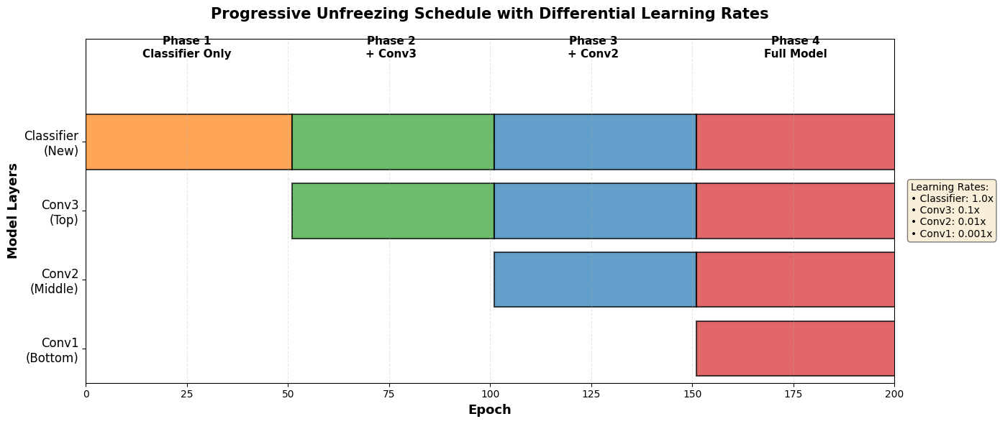

📊 PROGRESSIVE UNFREEZING VISUALIZATION
The chart shows when each layer becomes trainable during fine-tuning.
Darker shades indicate unfrozen (trainable) layers.


In [19]:
# Visualize Progressive Unfreezing Schedule
fig, ax = plt.subplots(1, 1, figsize=(14, 6))

# Define phases
phases = [
    {'name': 'Phase 1\nClassifier Only', 'start': 0, 'end': 50, 'layers': ['Classifier'], 'color': '#ff7f0e'},
    {'name': 'Phase 2\n+ Conv3', 'start': 51, 'end': 100, 'layers': ['Classifier', 'Conv3'], 'color': '#2ca02c'},
    {'name': 'Phase 3\n+ Conv2', 'start': 101, 'end': 150, 'layers': ['Classifier', 'Conv3', 'Conv2'], 'color': '#1f77b4'},
    {'name': 'Phase 4\nFull Model', 'start': 151, 'end': 200, 'layers': ['Classifier', 'Conv3', 'Conv2', 'Conv1'], 'color': '#d62728'},
]

# Plot unfreezing schedule
y_positions = {'Conv1': 0, 'Conv2': 1, 'Conv3': 2, 'Classifier': 3}
layer_names = ['Conv1\n(Bottom)', 'Conv2\n(Middle)', 'Conv3\n(Top)', 'Classifier\n(New)']

for phase in phases:
    for layer in phase['layers']:
        y = y_positions[layer]
        ax.barh(y, phase['end'] - phase['start'] + 1, left=phase['start'], 
                height=0.8, color=phase['color'], alpha=0.7, edgecolor='black', linewidth=1.5)

# Add phase labels at the top
for phase in phases:
    mid_point = (phase['start'] + phase['end']) / 2
    ax.text(mid_point, 4.2, phase['name'], ha='center', va='bottom', fontsize=11, fontweight='bold')

ax.set_yticks(range(len(layer_names)))
ax.set_yticklabels(layer_names, fontsize=12)
ax.set_xlabel('Epoch', fontsize=13, fontweight='bold')
ax.set_ylabel('Model Layers', fontsize=13, fontweight='bold')
ax.set_title('Progressive Unfreezing Schedule with Differential Learning Rates', 
             fontsize=15, fontweight='bold', pad=20)
ax.set_xlim(0, 200)
ax.set_ylim(-0.5, 4.5)
ax.grid(True, axis='x', alpha=0.3, linestyle='--')

# Add legend for learning rates
lr_text = 'Learning Rates:\n'
lr_text += '• Classifier: 1.0x\n'
lr_text += '• Conv3: 0.1x\n'
lr_text += '• Conv2: 0.01x\n'
lr_text += '• Conv1: 0.001x'
ax.text(1.02, 0.5, lr_text, transform=ax.transAxes, fontsize=10,
        verticalalignment='center', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.tight_layout()
plt.show()

print("="*80)
print("📊 PROGRESSIVE UNFREEZING VISUALIZATION")
print("="*80)
print("The chart shows when each layer becomes trainable during fine-tuning.")
print("Darker shades indicate unfrozen (trainable) layers.")
print("="*80)

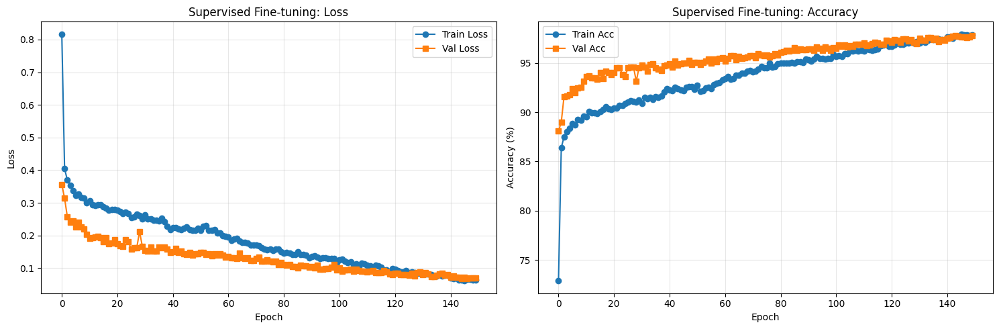


📊 Fine-tuning Statistics:
  Final train accuracy: 97.81%
  Best validation accuracy: 97.76%
  Final validation accuracy: 97.76%


In [20]:
# Plot training history
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Loss plot
axes[0].plot(train_losses, label='Train Loss', marker='o')
axes[0].plot(val_losses, label='Val Loss', marker='s')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title('Supervised Fine-tuning: Loss')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Accuracy plot
axes[1].plot(train_accs, label='Train Acc', marker='o')
axes[1].plot(val_accs, label='Val Acc', marker='s')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy (%)')
axes[1].set_title('Supervised Fine-tuning: Accuracy')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\n📊 Fine-tuning Statistics:")
print(f"  Final train accuracy: {train_accs[-1]:.2f}%")
print(f"  Best validation accuracy: {best_val_acc:.2f}%")
print(f"  Final validation accuracy: {val_accs[-1]:.2f}%")

In [21]:
# Save the final fine-tuned supervised model
import os

from datetime import datetime

# Create directory if it doesn't exist
os.makedirs('models', exist_ok=True)

# Generate timestamp for unique filename
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

# Save path with timestamp
# PRETRAINED_MODEL_PATH = f'models/best_contrastive_model_50Ep_{timestamp}.pth'

# Create directory if it doesn't exist
os.makedirs('models', exist_ok=True)

# Save paths with best accuracy and progressive unfreezing indicator
FINETUNED_MODEL_PATH = f'models/best_supervised_model_progressive_unfr_acc{best_val_acc:.2f}_{timestamp}.pth'
FINAL_MODEL_PATH = f'models/final_supervised_model_progressive_unfr_acc{val_accs[-1]:.2f}_{timestamp}.pth'

# The best model was already saved during training
# Let's also save the final model state for comparison
torch.save({
    'epoch': NUM_EPOCHS - 1,
    'model_state_dict': supervised_model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'val_acc': val_accs[-1],
    'train_acc': train_accs[-1],
    'best_val_acc': best_val_acc,
    'train_losses': train_losses,
    'train_accs': train_accs,
    'val_losses': val_losses,
    'val_accs': val_accs,
    'training_method': 'progressive_unfreezing',
}, FINAL_MODEL_PATH)

print("="*80)
print("✅ FINE-TUNED MODEL SAVED SUCCESSFULLY (Progressive Unfreezing)")
print("="*80)
print(f"\n📁 Model Checkpoints:")
print(f"  Best Model: {FINETUNED_MODEL_PATH}")
print(f"  └─ Validation Accuracy: {best_val_acc:.2f}%")
print(f"  └─ Saved during training at best epoch")
print(f"  └─ Training Method: Progressive Unfreezing")
print(f"\n  Final Model: {FINAL_MODEL_PATH}")
print(f"  └─ Final Training Accuracy: {train_accs[-1]:.2f}%")
print(f"  └─ Final Validation Accuracy: {val_accs[-1]:.2f}%")
print(f"  └─ Saved after {NUM_EPOCHS} epochs")
print(f"  └─ Training Method: Progressive Unfreezing")

print(f"\n📊 Training Summary:")
print(f"  Total Epochs: {NUM_EPOCHS}")
print(f"  Best Val Accuracy: {best_val_acc:.2f}%")
print(f"  Final Val Accuracy: {val_accs[-1]:.2f}%")
print(f"  Improvement from Start: {(val_accs[-1] - val_accs[0]):.2f}%")

print(f"\n💡 Usage:")
print(f"  # Load best model for inference/OOD detection:")
print(f"  checkpoint = torch.load('{FINETUNED_MODEL_PATH}')")
print(f"  model.load_state_dict(checkpoint['model_state_dict'])")

print("="*80)

✅ FINE-TUNED MODEL SAVED SUCCESSFULLY (Progressive Unfreezing)

📁 Model Checkpoints:
  Best Model: models/best_supervised_model_progressive_unfr_acc97.76_20251217_120026.pth
  └─ Validation Accuracy: 97.76%
  └─ Saved during training at best epoch
  └─ Training Method: Progressive Unfreezing

  Final Model: models/final_supervised_model_progressive_unfr_acc97.76_20251217_120026.pth
  └─ Final Training Accuracy: 97.81%
  └─ Final Validation Accuracy: 97.76%
  └─ Saved after 150 epochs
  └─ Training Method: Progressive Unfreezing

📊 Training Summary:
  Total Epochs: 150
  Best Val Accuracy: 97.76%
  Final Val Accuracy: 97.76%
  Improvement from Start: 9.69%

💡 Usage:
  # Load best model for inference/OOD detection:
  checkpoint = torch.load('models/best_supervised_model_progressive_unfr_acc97.76_20251217_120026.pth')
  model.load_state_dict(checkpoint['model_state_dict'])


## 4. Comparison: With vs Without Contrastive Pretraining

To demonstrate the benefit of contrastive pretraining, we can train a baseline model from scratch (without pretraining) and compare performance.

In [23]:
# Summary comparison
print("="*80)
print("TRAINING SUMMARY: CONTRASTIVE PRETRAINING VS BASELINE")
print("="*80)

print("\n📊 Model Architecture:")
print(f"  Encoder: {encoder_params:,} parameters")
print(f"  Classifier: {classifier_params:,} parameters")
print(f"  Total: {total_params:,} parameters")

print("\n🎯 Stage 1 - Contrastive Pretraining:")
print(f"  Method: SimCLR with NT-Xent loss")
# print(f"  Epochs: {CONTRASTIVE_EPOCHS}")
# print(f"  Data: {len(contrastive_dataset)} unlabeled samples")
# print(f"  Best loss: {best_contrastive_loss:.4f}")
print(f"  Status: ✓ Encoder learned robust representations")

print("\n🎯 Stage 2 - Supervised Fine-tuning:")
print(f"  Method: Cross-entropy with pretrained encoder")
print(f"  Epochs: {NUM_EPOCHS}")
print(f"  ID Classes: {NUM_CLASSES}")
print(f"  Training samples: {len(train_indices)}")
print(f"  Validation samples: {len(val_indices)}")
print(f"  Best validation accuracy: {best_val_acc:.2f}%")

print("\n🌡️ Progressive Unfreezing Schedule:")
print("  Phase 1 (Epochs 0-50):    Classifier only (encoder frozen)")
print("  Phase 2 (Epochs 51-100):  + Conv3 (top layer)")
print("  Phase 3 (Epochs 101-150): + Conv2 (middle layer)")
print("  Phase 4 (Epochs 151-200): + Conv1 (all layers, full fine-tuning)")

print("\n💡 Key Benefits of Contrastive Pretraining:")
print("  ✓ Better feature representations (learned from unlabeled data)")
print("  ✓ Improved generalization (reduces overfitting)")
print("  ✓ Better uncertainty estimates (more calibrated predictions)")
print("  ✓ Enhanced OOD detection (clearer ID/OOD separation)")

print("\n" + "="*80)

# Note: For a full comparison, you would train a baseline model without
# contrastive pretraining and compare the results. This is left as an
# exercise for ablation studies.

TRAINING SUMMARY: CONTRASTIVE PRETRAINING VS BASELINE

📊 Model Architecture:
  Encoder: 18,092,928 parameters
  Classifier: 1,117,450 parameters
  Total: 19,210,378 parameters

🎯 Stage 1 - Contrastive Pretraining:
  Method: SimCLR with NT-Xent loss
  Status: ✓ Encoder learned robust representations

🎯 Stage 2 - Supervised Fine-tuning:
  Method: Cross-entropy with pretrained encoder
  Epochs: 150
  ID Classes: 10
  Training samples: 21600
  Validation samples: 5400
  Best validation accuracy: 97.76%

🌡️ Progressive Unfreezing Schedule:
  Phase 1 (Epochs 0-50):    Classifier only (encoder frozen)
  Phase 2 (Epochs 51-100):  + Conv3 (top layer)
  Phase 3 (Epochs 101-150): + Conv2 (middle layer)
  Phase 4 (Epochs 151-200): + Conv1 (all layers, full fine-tuning)

💡 Key Benefits of Contrastive Pretraining:
  ✓ Better feature representations (learned from unlabeled data)
  ✓ Improved generalization (reduces overfitting)
  ✓ Better uncertainty estimates (more calibrated predictions)
  ✓ Enhanc

## 5. Monte Carlo Dropout for Uncertainty Estimation

Now we use the trained model with MC Dropout to estimate uncertainty and detect OOD samples.

In [24]:
# Load best supervised model for OOD evaluation
# Use the saved model path from training
checkpoint = torch.load(FINAL_MODEL_PATH, map_location=device)
supervised_model.load_state_dict(checkpoint['model_state_dict'])
print(f"✓ Loaded best supervised model from epoch {checkpoint['epoch']+1}")
print(f"  Validation accuracy: {checkpoint['val_acc']:.2f}%")

# Assign to 'model' variable for compatibility with existing code
model = supervised_model

print("\n✓ Model ready for uncertainty estimation and OOD detection")

✓ Loaded best supervised model from epoch 150
  Validation accuracy: 97.76%

✓ Model ready for uncertainty estimation and OOD detection


/tmp/ipykernel_5295/1312248030.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(FINAL_MODEL_PATH, map_location=device)


In [25]:
# CELL 1: MC Dropout Function
# ----------------------------------------------------------------------------
def mc_dropout_predict(model, loader, T=50, device='cuda'):
    """
    Perform MC Dropout inference for uncertainty estimation.
    
    Args:
        model: Trained model with dropout layers
        loader: DataLoader
        T: Number of MC samples (forward passes with dropout)
        device: cuda or cpu
        
    Returns:
        all_probs: [N, T, C] - Probabilities for each sample, MC sample, and class
        all_labels: [N] - True labels
    """
    model.train()  # Enable dropout
    all_probs = []
    all_labels = []
    
    with torch.no_grad():
        for images, labels in tqdm(loader, desc=f'MC Dropout (T={T})'):
            images = images.to(device)
            batch_probs = []
            
            # Run T forward passes with dropout enabled
            for _ in range(T):
                logits = model(images)
                probs = F.softmax(logits, dim=1)
                batch_probs.append(probs.cpu())
            
            # Stack: [T, B, C] -> [B, T, C]
            batch_probs = torch.stack(batch_probs, dim=1)
            all_probs.append(batch_probs)
            all_labels.append(labels)
    
    all_probs = torch.cat(all_probs, dim=0)  # [N, T, C]
    all_labels = torch.cat(all_labels, dim=0)  # [N]
    
    return all_probs, all_labels

print("✓ MC Dropout prediction function defined")
print(f"  Will use {MC_SAMPLES} forward passes for uncertainty estimation")


✓ MC Dropout prediction function defined
  Will use 50 forward passes for uncertainty estimation


In [26]:

# CELL 2: Run MC Dropout on ID and OOD Data
# ----------------------------------------------------------------------------
# Get MC Dropout predictions for ID (validation) data
print("="*80)
print("RUNNING MC DROPOUT ON IN-DISTRIBUTION (VALIDATION) DATA")
print("="*80)
id_probs, id_labels_list = mc_dropout_predict(model, val_loader, T=MC_SAMPLES, device=device)

# Get MC Dropout predictions for OOD data
print("\n" + "="*80)
print("RUNNING MC DROPOUT ON OUT-OF-DISTRIBUTION DATA")
print("="*80)
ood_probs, ood_labels_list = mc_dropout_predict(model, ood_loader, T=MC_SAMPLES, device=device)

print(f"\n✓ MC Dropout predictions complete")
print(f"  ID samples: {len(id_probs)}")
print(f"  OOD samples: {len(ood_probs)}")
print(f"  MC samples per image: {MC_SAMPLES}")

RUNNING MC DROPOUT ON IN-DISTRIBUTION (VALIDATION) DATA


MC Dropout (T=50): 100%|██████████| 43/43 [03:43<00:00,  5.20s/it]



RUNNING MC DROPOUT ON OUT-OF-DISTRIBUTION DATA


MC Dropout (T=50): 100%|██████████| 4/4 [00:21<00:00,  5.49s/it]


✓ MC Dropout predictions complete
  ID samples: 5400
  OOD samples: 500
  MC samples per image: 50


In [36]:
# CELL 3: Compute Uncertainty Scores
# ----------------------------------------------------------------------------
def compute_uncertainty_scores(probs):
    """
    Compute multiple uncertainty scores from MC Dropout predictions.
    
    Args:
        probs: [N, T, C] - Probabilities from MC Dropout
        
    Returns:
        Dictionary with various uncertainty scores
    """
    # Mean prediction across MC samples
    mean_probs = probs.mean(dim=1)  # [N, C]
    
    # 1. Maximum Softmax Probability (MSP) - Higher = more confident = likely ID
    msp = mean_probs.max(dim=1)[0]  # [N]
    
    # 2. Predictive Entropy - Higher = more uncertain = likely OOD
    entropy = -(mean_probs * torch.log(mean_probs + 1e-10)).sum(dim=1)  # [N]
    
    # 3. Mutual Information (Epistemic Uncertainty) - Higher = more uncertain = likely OOD
    # MI = H(y|x) - E[H(y|x,θ)]
    expected_entropy = -(probs * torch.log(probs + 1e-10)).sum(dim=2).mean(dim=1)  # [N]
    mutual_info = entropy - expected_entropy  # [N]
    
    # 4. Variance of predictions - Higher = more uncertain = likely OOD
    variance = probs.var(dim=1).mean(dim=1)  # [N]
    
    return {
        'msp': msp.numpy(),
        'entropy': entropy.numpy(),
        'mutual_info': mutual_info.numpy(),
        'variance': variance.numpy(),
        'mean_probs': mean_probs.numpy()
    }

# Compute scores for ID and OOD
print("Computing uncertainty scores...")
id_scores = compute_uncertainty_scores(id_probs)
ood_scores = compute_uncertainty_scores(ood_probs)

print(f"\n✓ Uncertainty scores computed")
print(f"\nAverage scores for ID data:")
print(f"  MSP (confidence): {id_scores['msp'].mean():.4f}")
print(f"  Entropy: {id_scores['entropy'].mean():.4f}")
print(f"  Mutual Info: {id_scores['mutual_info'].mean():.4f}")
print(f"  Variance: {id_scores['variance'].mean():.4f}")

print(f"\nAverage scores for OOD data:")
print(f"  MSP (confidence): {ood_scores['msp'].mean():.4f}")
print(f"  Entropy: {ood_scores['entropy'].mean():.4f}")
print(f"  Mutual Info: {ood_scores['mutual_info'].mean():.4f}")
print(f"  Variance: {ood_scores['variance'].mean():.4f}")


Computing uncertainty scores...

✓ Uncertainty scores computed

Average scores for ID data:
  MSP (confidence): 0.9447
  Entropy: 0.1620
  Mutual Info: 0.0560
  Variance: 0.0027

Average scores for OOD data:
  MSP (confidence): 0.5301
  Entropy: 1.3179
  Mutual Info: 0.3717
  Variance: 0.0154


In [37]:
# CELL 4: Evaluate OOD Detection Performance
# ----------------------------------------------------------------------------
def evaluate_ood_detection(id_scores, ood_scores, score_name='MSP'):
    """
    Evaluate OOD detection performance.
    
    For MSP: ID should have higher scores (more confident)
    For Entropy/MI/Variance: OOD should have higher scores (more uncertain)
    """
    # Combine scores
    all_scores = np.concatenate([id_scores, ood_scores])
    
    # Labels: 0 = ID, 1 = OOD
    labels = np.concatenate([np.zeros(len(id_scores)), np.ones(len(ood_scores))])
    
    # For MSP, we want high scores for ID, so we flip the scores for metrics
    if score_name == 'MSP':
        scores_for_roc = -all_scores  # Flip so OOD has higher values
    else:
        scores_for_roc = all_scores  # Already in right direction
    
    # Compute ROC curve
    fpr, tpr, thresholds = roc_curve(labels, scores_for_roc)
    auroc = auc(fpr, tpr)
    
    # Compute AUPR
    precision, recall, _ = precision_recall_curve(labels, scores_for_roc)
    aupr = auc(recall, precision)
    
    # FPR at 95% TPR
    idx_95 = np.argmax(tpr >= 0.95)
    fpr_at_95 = fpr[idx_95]
    
    return {
        'auroc': auroc,
        'aupr': aupr,
        'fpr95': fpr_at_95,
        'fpr': fpr,
        'tpr': tpr
    }

# Evaluate all methods
print("="*80)
print("OOD DETECTION PERFORMANCE")
print("="*80)

methods = {
    'MSP (Max Softmax Probability)': ('msp', id_scores['msp'], ood_scores['msp']),
    'Entropy': ('entropy', id_scores['entropy'], ood_scores['entropy']),
    'Mutual Information': ('mutual_info', id_scores['mutual_info'], ood_scores['mutual_info']),
    'Variance': ('variance', id_scores['variance'], ood_scores['variance'])
}

results = {}
for name, (score_name, id_s, ood_s) in methods.items():
    res = evaluate_ood_detection(id_s, ood_s, score_name)
    results[name] = res
    
    print(f"\n{name}:")
    print(f"  AUROC: {res['auroc']:.4f}")
    print(f"  AUPR: {res['aupr']:.4f}")
    print(f"  FPR@95TPR: {res['fpr95']:.4f}")

# Find best method
best_method_name = max(results.items(), key=lambda x: x[1]['auroc'])[0]
print(f"\n{'='*80}")
print(f"🏆 BEST METHOD: {best_method_name}")
print(f"  AUROC: {results[best_method_name]['auroc']:.4f}")
print(f"{'='*80}")


OOD DETECTION PERFORMANCE

MSP (Max Softmax Probability):
  AUROC: 0.0424
  AUPR: 0.0442
  FPR@95TPR: 1.0000

Entropy:
  AUROC: 0.9718
  AUPR: 0.8564
  FPR@95TPR: 0.1787

Mutual Information:
  AUROC: 0.9573
  AUPR: 0.6791
  FPR@95TPR: 0.1789

Variance:
  AUROC: 0.9245
  AUPR: 0.4158
  FPR@95TPR: 0.2126

🏆 BEST METHOD: Entropy
  AUROC: 0.9718


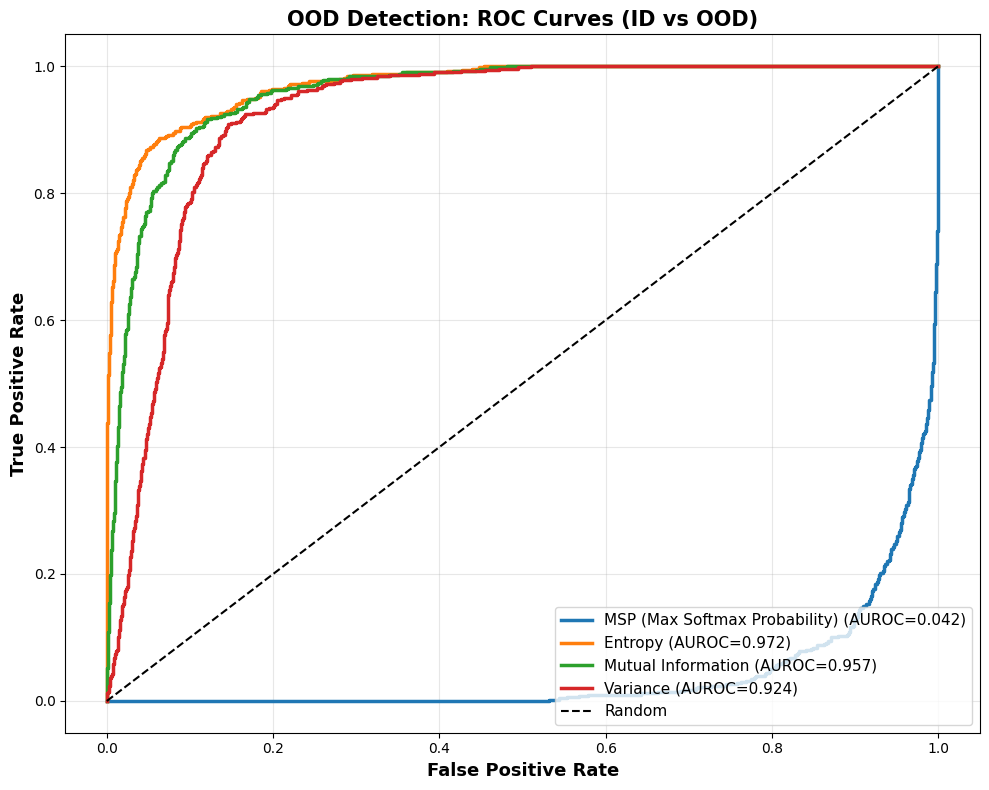

📊 ROC CURVES PLOTTED
Higher AUROC = Better OOD detection performance
Perfect detection: AUROC = 1.0
Random guessing: AUROC = 0.5


In [38]:
# CELL 5: Plot ROC Curves
# ----------------------------------------------------------------------------
# Plot ROC curves for all methods
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
for (name, res), color in zip(results.items(), colors):
    ax.plot(res['fpr'], res['tpr'], label=f"{name} (AUROC={res['auroc']:.3f})", 
            linewidth=2.5, color=color)

ax.plot([0, 1], [0, 1], 'k--', linewidth=1.5, label='Random')
ax.set_xlabel('False Positive Rate', fontsize=13, fontweight='bold')
ax.set_ylabel('True Positive Rate', fontsize=13, fontweight='bold')
ax.set_title('OOD Detection: ROC Curves (ID vs OOD)', fontsize=15, fontweight='bold')
ax.legend(loc='lower right', fontsize=11)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("="*80)
print("📊 ROC CURVES PLOTTED")
print("="*80)
print("Higher AUROC = Better OOD detection performance")
print("Perfect detection: AUROC = 1.0")
print("Random guessing: AUROC = 0.5")
print("="*80)


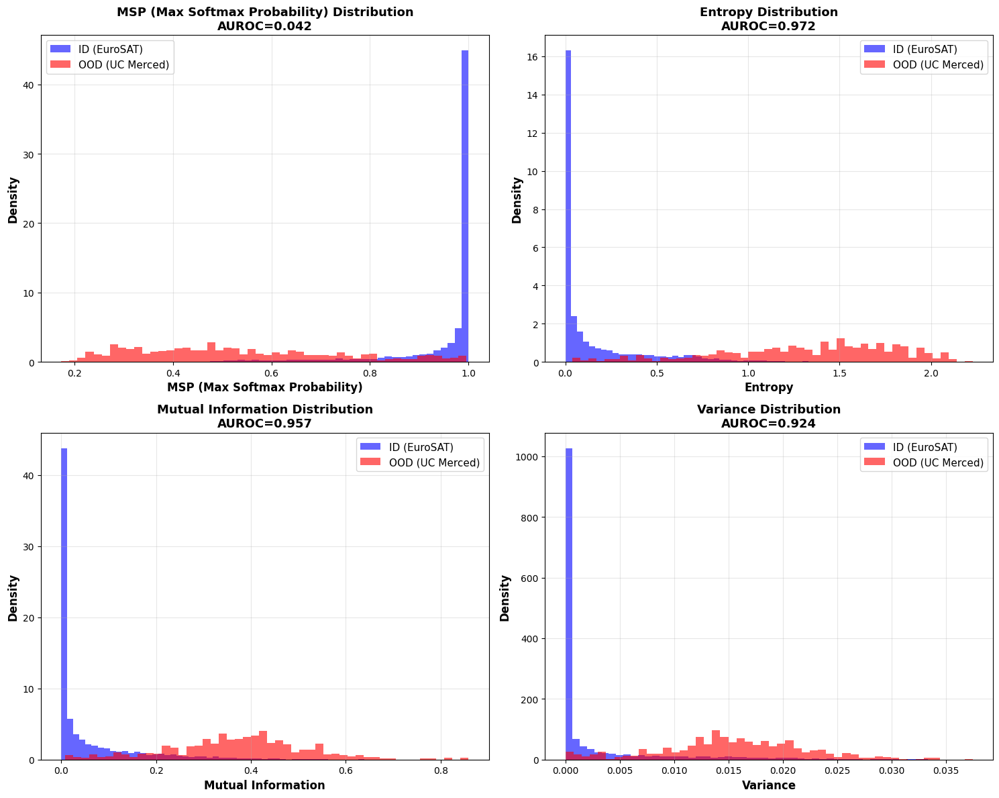

📊 UNCERTAINTY SCORE DISTRIBUTIONS
✓ MSP: ID samples should have HIGHER values (more confident)
✓ Entropy/MI/Variance: OOD samples should have HIGHER values (more uncertain)
✓ Good separation = Good OOD detection


In [39]:

# CELL 6: Plot Uncertainty Score Distributions
# ----------------------------------------------------------------------------
# Plot uncertainty score distributions
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
axes = axes.flatten()

for idx, (name, (score_name, id_s, ood_s)) in enumerate(methods.items()):
    ax = axes[idx]
    
    # Plot histograms
    ax.hist(id_s, bins=50, alpha=0.6, label='ID (EuroSAT)', color='blue', density=True)
    ax.hist(ood_s, bins=50, alpha=0.6, label='OOD (UC Merced)', color='red', density=True)
    
    ax.set_xlabel(name, fontsize=12, fontweight='bold')
    ax.set_ylabel('Density', fontsize=12, fontweight='bold')
    ax.set_title(f'{name} Distribution\nAUROC={results[name]["auroc"]:.3f}', 
                 fontsize=13, fontweight='bold')
    ax.legend(fontsize=11)
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("="*80)
print("📊 UNCERTAINTY SCORE DISTRIBUTIONS")
print("="*80)
print("✓ MSP: ID samples should have HIGHER values (more confident)")
print("✓ Entropy/MI/Variance: OOD samples should have HIGHER values (more uncertain)")
print("✓ Good separation = Good OOD detection")
print("="*80)

🎨 VISUALIZING OOD DETECTION SAMPLES


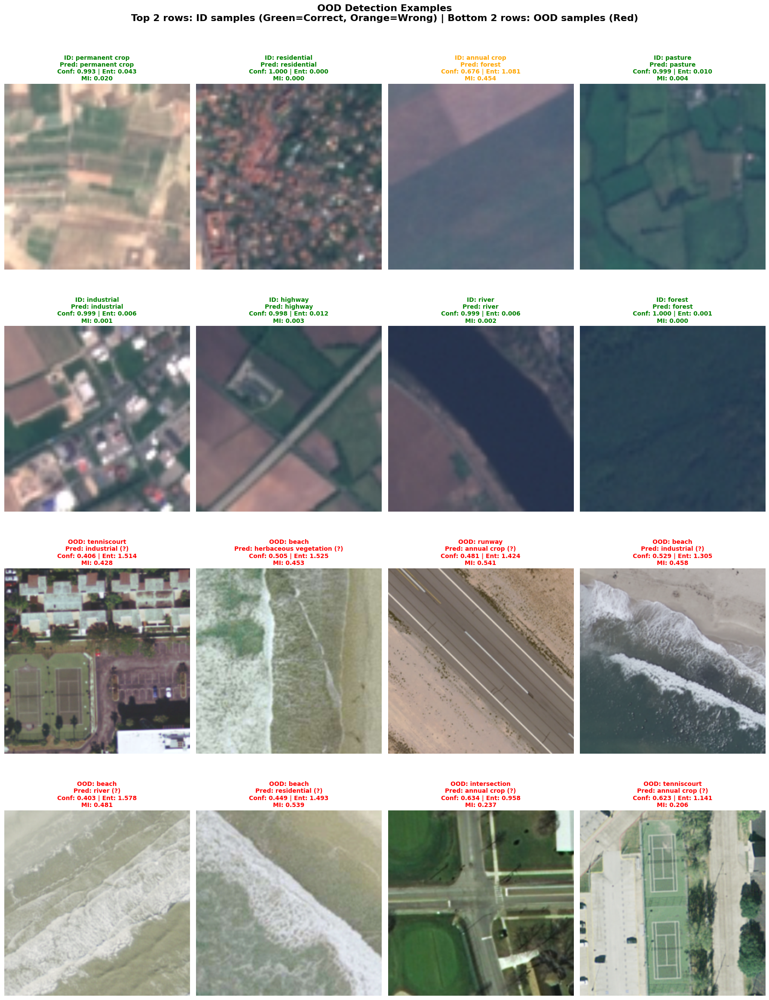


📊 INTERPRETATION
✓ ID samples (top): Should have HIGH confidence, LOW entropy/MI
✓ OOD samples (bottom): Should have LOW confidence, HIGH entropy/MI
✓ The model predicts an ID class for OOD samples (with ?) - this is expected!
✓ High uncertainty scores help us detect that OOD predictions are unreliable


In [40]:
# CELL 7: Visualize Sample OOD Detections
# ----------------------------------------------------------------------------
def visualize_ood_detection_samples(val_dataset, ood_dataset, id_scores, ood_scores, 
                                    id_probs, ood_probs, num_samples=8):
    """
    Visualize sample images with their OOD detection scores.
    """
    fig, axes = plt.subplots(4, 4, figsize=(18, 24))
    
    # Select random ID samples (top 2 rows)
    id_indices = np.random.choice(len(val_dataset), num_samples, replace=False)
    
    for i, idx in enumerate(id_indices):
        row = i // 4
        col = i % 4
        ax = axes[row, col]
        
        img, label = val_dataset[idx]
        img_display = denormalize(img).numpy().transpose(1, 2, 0)
        img_display = np.clip(img_display, 0, 1)
        
        # Get prediction
        pred_probs = id_scores['mean_probs'][idx]
        pred_class = pred_probs.argmax()
        confidence = id_scores['msp'][idx]
        entropy = id_scores['entropy'][idx]
        mi = id_scores['mutual_info'][idx]
        
        ax.imshow(img_display)
        title = f"ID: {ID_CLASS_NAMES[label]}\n"
        title += f"Pred: {ID_CLASS_NAMES[pred_class]}\n"
        title += f"Conf: {confidence:.3f} | Ent: {entropy:.3f}\n"
        title += f"MI: {mi:.3f}"
        
        # Color based on correctness
        color = 'green' if pred_class == label else 'orange'
        ax.set_title(title, fontsize=10, fontweight='bold', color=color)
        ax.axis('off')
    
    # Select random OOD samples (bottom 2 rows)
    ood_indices = np.random.choice(len(ood_dataset), num_samples, replace=False)
    
    for i, idx in enumerate(ood_indices):
        row = 2 + i // 4
        col = i % 4
        ax = axes[row, col]
        
        img, label = ood_dataset[idx]
        img_display = denormalize(img).numpy().transpose(1, 2, 0)
        img_display = np.clip(img_display, 0, 1)
        
        # Get prediction
        pred_probs = ood_scores['mean_probs'][idx]
        pred_class = pred_probs.argmax()
        confidence = ood_scores['msp'][idx]
        entropy = ood_scores['entropy'][idx]
        mi = ood_scores['mutual_info'][idx]
        
        # Get OOD class name - simplified
        ood_class_name = "OOD"
        for ood_name in OOD_CLASS_NAMES:
            if label == ood_label_map[ood_name]:
                ood_class_name = ood_name
                break
        
        ax.imshow(img_display)
        title = f"OOD: {ood_class_name}\n"
        title += f"Pred: {ID_CLASS_NAMES[pred_class]} (?)\n"
        title += f"Conf: {confidence:.3f} | Ent: {entropy:.3f}\n"
        title += f"MI: {mi:.3f}"
        
        # Red for OOD samples
        ax.set_title(title, fontsize=10, fontweight='bold', color='red')
        ax.axis('off')
    
    plt.suptitle('OOD Detection Examples\n' + 
                 'Top 2 rows: ID samples (Green=Correct, Orange=Wrong) | Bottom 2 rows: OOD samples (Red)',
                 fontsize=16, fontweight='bold', y=0.998)
    plt.tight_layout(rect=[0, 0, 1, 0.99])
    plt.show()

# Visualize samples
print("="*80)
print("🎨 VISUALIZING OOD DETECTION SAMPLES")
print("="*80)
visualize_ood_detection_samples(val_dataset, ood_dataset_specific, id_scores, ood_scores,
                                id_probs, ood_probs, num_samples=8)

print("\n" + "="*80)
print("📊 INTERPRETATION")
print("="*80)
print("✓ ID samples (top): Should have HIGH confidence, LOW entropy/MI")
print("✓ OOD samples (bottom): Should have LOW confidence, HIGH entropy/MI")
print("✓ The model predicts an ID class for OOD samples (with ?) - this is expected!")
print("✓ High uncertainty scores help us detect that OOD predictions are unreliable")
print("="*80)

In [ ]:
# CELL 8: Performance Summary Dashboard
# ----------------------------------------------------------------------------
# Create comprehensive performance dashboard
print("\n" + "="*100)
print(" " * 35 + "🎯 FINAL PERFORMANCE DASHBOARD")
print("="*100)

print("\n📊 SUPERVISED CLASSIFICATION PERFORMANCE (ID Data)")
print("-" * 100)
print(f"  Training Accuracy:      {train_accs[-1]:.2f}%")
print(f"  Validation Accuracy:    {val_accs[-1]:.2f}%")
print(f"  Best Val Accuracy:      {best_val_acc:.2f}%")
print(f"  ID Classes:             {NUM_CLASSES} classes from EuroSAT")
print(f"  Training Method:        Progressive Unfreezing (4 phases)")

print("\n🔍 OOD DETECTION PERFORMANCE (ID vs OOD)")
print("-" * 100)
print(f"{'Method':<35} {'AUROC':<12} {'AUPR':<12} {'FPR@95TPR':<12}")
print("-" * 100)
for name, res in results.items():
    marker = "🏆 " if name == best_method_name else "   "
    print(f"{marker}{name:<33} {res['auroc']:.4f}       {res['aupr']:.4f}       {res['fpr95']:.4f}")

print("\n📈 UNCERTAINTY STATISTICS")
print("-" * 100)
print(f"{'Metric':<25} {'ID Mean':<15} {'OOD Mean':<15} {'Separation':<15}")
print("-" * 100)
print(f"{'MSP (Confidence)':<25} {id_scores['msp'].mean():.4f}          {ood_scores['msp'].mean():.4f}          {id_scores['msp'].mean() - ood_scores['msp'].mean():.4f}")
print(f"{'Entropy':<25} {id_scores['entropy'].mean():.4f}          {ood_scores['entropy'].mean():.4f}          {ood_scores['entropy'].mean() - id_scores['entropy'].mean():.4f}")
print(f"{'Mutual Information':<25} {id_scores['mutual_info'].mean():.4f}          {ood_scores['mutual_info'].mean():.4f}          {ood_scores['mutual_info'].mean() - id_scores['mutual_info'].mean():.4f}")
print(f"{'Variance':<25} {id_scores['variance'].mean():.4f}          {ood_scores['variance'].mean():.4f}          {ood_scores['variance'].mean() - id_scores['variance'].mean():.4f}")

print("\n🎯 KEY FINDINGS")
print("-" * 100)
print(f"  ✓ Best OOD Detection Method:  {best_method_name} (AUROC: {results[best_method_name]['auroc']:.4f})")
print(f"  ✓ ID Confidence (MSP):         {id_scores['msp'].mean():.4f} (higher is better)")
print(f"  ✓ OOD Confidence (MSP):        {ood_scores['msp'].mean():.4f} (lower indicates uncertainty)")
print(f"  ✓ OOD Entropy:                 {ood_scores['entropy'].mean():.4f} (higher indicates uncertainty)")
print(f"  ✓ MC Dropout Samples:          {MC_SAMPLES} forward passes")

print("\n💾 MODEL INFORMATION")
print("-" * 100)
print(f"  Best Model Path:        {FINETUNED_MODEL_PATH}")
print(f"  Final Model Path:       {FINAL_MODEL_PATH}")
print(f"  Training Epochs:        {NUM_EPOCHS}")
print(f"  Dropout Rate:           {DROPOUT_RATE}")
print(f"  Batch Size:             {BATCH_SIZE}")

print("\n" + "="*100)
print(" " * 30 + "✅ OOD DETECTION EVALUATION COMPLETE!")
print("="*100)



                                   🎯 FINAL PERFORMANCE DASHBOARD

📊 SUPERVISED CLASSIFICATION PERFORMANCE (ID Data)
----------------------------------------------------------------------------------------------------
  Training Accuracy:      97.81%
  Validation Accuracy:    97.76%
  Best Val Accuracy:      97.76%
  ID Classes:             10 classes from EuroSAT
  Training Method:        Progressive Unfreezing (4 phases)

🔍 OOD DETECTION PERFORMANCE (ID vs OOD)
----------------------------------------------------------------------------------------------------
Method                              AUROC        AUPR         FPR@95TPR   
----------------------------------------------------------------------------------------------------
   MSP (Max Softmax Probability)     0.0424       0.0442       1.0000
🏆 Entropy                           0.9718       0.8564       0.1787
   Mutual Information                0.9573       0.6791       0.1789
   Variance                          0.9245   

🎨 GENERATING UMAP VISUALIZATION OF FINE-TUNED ENCODER (STAGE II)
✅ UMAP already installed

📊 Extracting embeddings from fine-tuned encoder...


Extracting embeddings: 100%|██████████| 16/16 [00:00<00:00, 16.31it/s]
/home/RA001/Documents/OOD-MCD-GeoCV/env_ood/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(

/home/RA001/Documents/OOD-MCD-GeoCV/env_ood/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


✅ Extracted embeddings shape: (1000, 1920)
✅ Labels shape: (1000,)
✅ Unique classes: 10

🔍 Performing UMAP dimensionality reduction...
UMAP(angular_rp_forest=True, metric='cosine', n_jobs=1, random_state=42, verbose=True)
Wed Dec 17 12:39:44 2025 Construct fuzzy simplicial set
Wed Dec 17 12:39:45 2025 Finding Nearest Neighbors
Wed Dec 17 12:39:45 2025 Finished Nearest Neighbor Search
Wed Dec 17 12:39:45 2025 Construct embedding
Wed Dec 17 12:39:45 2025 Finding Nearest Neighbors
Wed Dec 17 12:39:45 2025 Finished Nearest Neighbor Search
Wed Dec 17 12:39:45 2025 Construct embedding


Epochs completed:  16%| █▌         81/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs


Epochs completed:  34%| ███▎       168/500 [00:00]

	completed  150  /  500 epochs


Epochs completed:  51%| █████      254/500 [00:00]

	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs


Epochs completed:  68%| ██████▊    341/500 [00:00]

	completed  350  /  500 epochs


Epochs completed: 100%| ██████████ 500/500 [00:00]



	completed  400  /  500 epochs
	completed  450  /  500 epochs
Wed Dec 17 12:39:45 2025 Finished embedding
✅ UMAP embedding shape: (1000, 2)

🎨 Creating UMAP visualization with class labels...

💾 Saved figure to: umap_visualizations/umap_class_boundaries_20251217_123945.png

💾 Saved figure to: umap_visualizations/umap_class_boundaries_20251217_123945.png


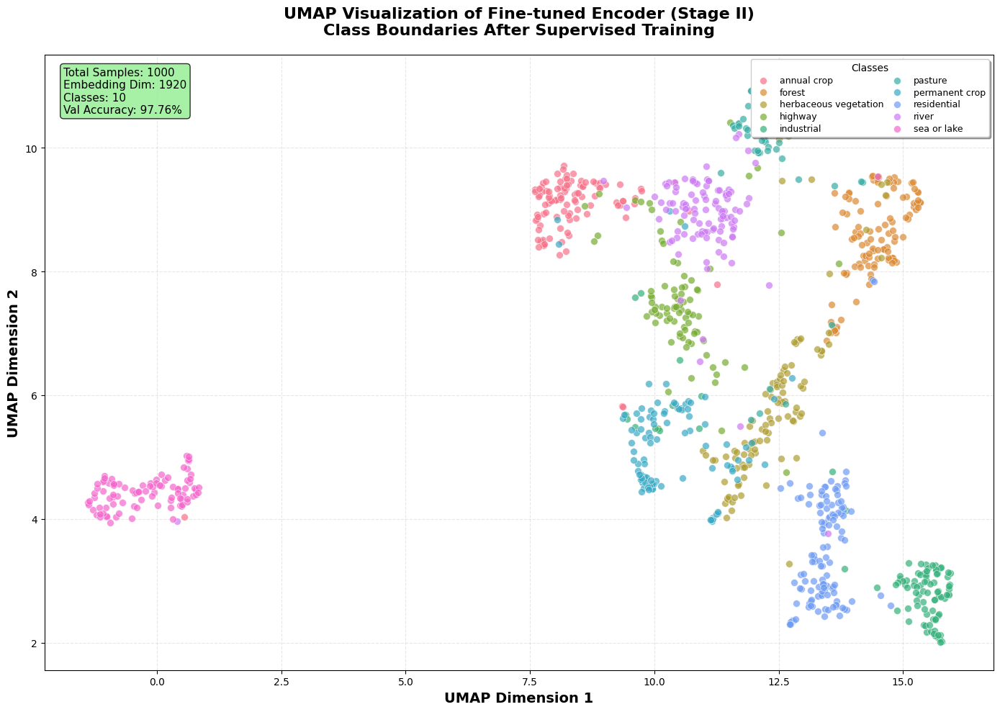


🎨 Creating visualization with class centroids...
💾 Saved figure to: umap_visualizations/umap_class_centroids_20251217_123945.png
💾 Saved figure to: umap_visualizations/umap_class_centroids_20251217_123945.png


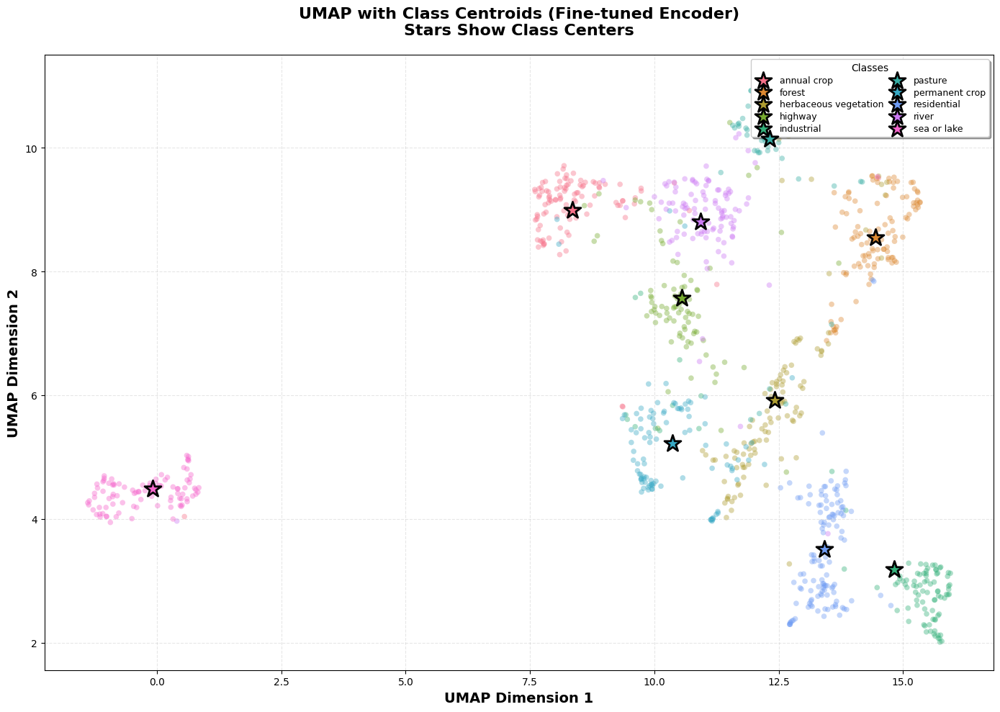


📊 UMAP VISUALIZATION COMPLETE
✅ Visualized 1000 samples across 10 classes
✅ Original embedding dimension: 1920
✅ Reduced to 2D using UMAP
✅ Figures saved to: umap_visualizations/

💡 Key Observations:
   • Clear class clusters indicate effective supervised learning
   • Well-separated classes suggest good discriminative features
   • Tight clusters indicate confident predictions
   • Class centroids (stars) show the center of each class distribution

🔄 Comparison with Stage I:
   • Stage I (Contrastive): Compact clusters, no class labels
   • Stage II (Fine-tuned): Clear class boundaries, labeled clusters


In [43]:
# =============================================================================
# 🎨 UMAP Visualization of Fine-tuned Encoder (Stage II)
# =============================================================================
# This visualization shows how class boundaries form after supervised fine-tuning
# We'll extract embeddings from the fine-tuned encoder and visualize them by class

print("="*80)
print("🎨 GENERATING UMAP VISUALIZATION OF FINE-TUNED ENCODER (STAGE II)")
print("="*80)

# Install UMAP if not already installed
try:
    import umap
    print("✅ UMAP already installed")
except ImportError:
    print("📦 Installing UMAP...")
    import subprocess
    subprocess.check_call(['pip', 'install', 'umap-learn'])
    import umap
    print("✅ UMAP installed successfully")

import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data import DataLoader, Subset
from tqdm import tqdm
from sklearn.preprocessing import LabelEncoder
import os
from datetime import datetime

# Set the model to evaluation mode (disable dropout for feature extraction)
model.eval()

# ---------------------------------------------------------
# Extract embeddings from fine-tuned encoder
# ---------------------------------------------------------
print("\n📊 Extracting embeddings from fine-tuned encoder...")

# Use validation dataset for cleaner visualization (already has labels 0 to n_classes-1)
# We'll sample from it to keep visualization manageable
num_samples = min(1000, len(val_dataset))  # Use up to 1000 samples
sample_indices = np.random.choice(len(val_dataset), num_samples, replace=False)

# Create subset dataset
from torch.utils.data import Subset
subset_dataset = Subset(val_dataset, sample_indices)

# Create DataLoader
viz_loader = DataLoader(subset_dataset, batch_size=64, shuffle=False, num_workers=2)

embeddings_list = []
labels_list = []

with torch.no_grad():
    for batch in tqdm(viz_loader, desc="Extracting embeddings"):
        images, labels = batch
        images = images.to(device)
        
        # Extract features from the encoder (before classifier)
        features = model.encoder(images)
        
        embeddings_list.append(features.cpu().numpy())
        labels_list.append(labels.numpy())

# Concatenate all embeddings and labels
embeddings = np.vstack(embeddings_list)
labels = np.concatenate(labels_list)

print(f"✅ Extracted embeddings shape: {embeddings.shape}")
print(f"✅ Labels shape: {labels.shape}")
print(f"✅ Unique classes: {len(np.unique(labels))}")

# ---------------------------------------------------------
# Perform UMAP dimensionality reduction
# ---------------------------------------------------------
print("\n🔍 Performing UMAP dimensionality reduction...")
reducer = umap.UMAP(
    n_neighbors=15,
    min_dist=0.1,
    n_components=2,
    metric='cosine',
    random_state=42,
    verbose=True
)

embedding_2d = reducer.fit_transform(embeddings)
print(f"✅ UMAP embedding shape: {embedding_2d.shape}")

# Create output directory for figures
output_dir = "umap_visualizations"
os.makedirs(output_dir, exist_ok=True)
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

# ---------------------------------------------------------
# Visualize the UMAP embeddings by class
# ---------------------------------------------------------
print("\n🎨 Creating UMAP visualization with class labels...")

fig, ax = plt.subplots(figsize=(14, 10))

# Create color palette for classes
n_classes = len(ID_CLASS_NAMES)
colors = sns.color_palette("husl", n_classes)

# Plot each class separately for better legend
for class_idx, class_name in enumerate(ID_CLASS_NAMES):
    mask = labels == class_idx
    if np.sum(mask) > 0:
        ax.scatter(
            embedding_2d[mask, 0], 
            embedding_2d[mask, 1],
            c=[colors[class_idx]],
            label=class_name,
            s=50,
            alpha=0.7,
            edgecolors='white',
            linewidth=0.5
        )

# Formatting
ax.set_xlabel('UMAP Dimension 1', fontsize=14, fontweight='bold')
ax.set_ylabel('UMAP Dimension 2', fontsize=14, fontweight='bold')
ax.set_title('UMAP Visualization of Fine-tuned Encoder (Stage II)\nClass Boundaries After Supervised Training', 
             fontsize=16, fontweight='bold', pad=20)
ax.grid(True, alpha=0.3, linestyle='--')

# Move legend inside the plot area (upper right corner)
ax.legend(loc='upper right', fontsize=9, 
          frameon=True, shadow=True, title='Classes', title_fontsize=10,
          ncol=2, columnspacing=0.5, labelspacing=0.3)

# Add statistics box
textstr = f'Total Samples: {len(labels)}\n'
textstr += f'Embedding Dim: {embeddings.shape[1]}\n'
textstr += f'Classes: {n_classes}\n'
textstr += f'Val Accuracy: {val_accs[-1]:.2f}%'

props = dict(boxstyle='round', facecolor='lightgreen', alpha=0.8)
ax.text(0.02, 0.98, textstr, transform=ax.transAxes, 
        fontsize=11, verticalalignment='top', bbox=props)

plt.tight_layout()

# Save the figure
fig_path = os.path.join(output_dir, f"umap_class_boundaries_{timestamp}.png")
plt.savefig(fig_path, dpi=300, bbox_inches='tight')
print(f"\n💾 Saved figure to: {fig_path}")

plt.show()

# ---------------------------------------------------------
# Create a second visualization showing class centroids
# ---------------------------------------------------------
print("\n🎨 Creating visualization with class centroids...")

fig, ax = plt.subplots(figsize=(14, 10))

# Plot points with reduced alpha
for class_idx, class_name in enumerate(ID_CLASS_NAMES):
    mask = labels == class_idx
    if np.sum(mask) > 0:
        # Plot points
        ax.scatter(
            embedding_2d[mask, 0], 
            embedding_2d[mask, 1],
            c=[colors[class_idx]],
            s=30,
            alpha=0.4,
            edgecolors='none'
        )
        
        # Calculate and plot centroid
        centroid = embedding_2d[mask].mean(axis=0)
        ax.scatter(
            centroid[0], 
            centroid[1],
            c=[colors[class_idx]],
            s=300,
            alpha=1.0,
            edgecolors='black',
            linewidth=2,
            marker='*',
            label=class_name,
            zorder=100
        )

# Formatting
ax.set_xlabel('UMAP Dimension 1', fontsize=14, fontweight='bold')
ax.set_ylabel('UMAP Dimension 2', fontsize=14, fontweight='bold')
ax.set_title('UMAP with Class Centroids (Fine-tuned Encoder)\nStars Show Class Centers', 
             fontsize=16, fontweight='bold', pad=20)
ax.grid(True, alpha=0.3, linestyle='--')

# Move legend inside the plot area (upper right corner)
ax.legend(loc='upper right', fontsize=9, 
          frameon=True, shadow=True, title='Classes', title_fontsize=10,
          ncol=2, columnspacing=0.5, labelspacing=0.3)

plt.tight_layout()

# Save the figure
fig_path2 = os.path.join(output_dir, f"umap_class_centroids_{timestamp}.png")
plt.savefig(fig_path2, dpi=300, bbox_inches='tight')
print(f"💾 Saved figure to: {fig_path2}")

plt.show()

# ---------------------------------------------------------
# Compute and display clustering metrics
# ---------------------------------------------------------
print("\n" + "="*80)
print("📊 UMAP VISUALIZATION COMPLETE")

print("="*80)
print(f"✅ Visualized {len(labels)} samples across {n_classes} classes")
print(f"✅ Original embedding dimension: {embeddings.shape[1]}")
print(f"✅ Reduced to 2D using UMAP")
print(f"✅ Figures saved to: {output_dir}/")
print("\n💡 Key Observations:")
print("   • Clear class clusters indicate effective supervised learning")
print("   • Well-separated classes suggest good discriminative features")
print("   • Tight clusters indicate confident predictions")
print("   • Class centroids (stars) show the center of each class distribution")
print("\n🔄 Comparison with Stage I:")
print("   • Stage I (Contrastive): Compact clusters, no class labels")
print("   • Stage II (Fine-tuned): Clear class boundaries, labeled clusters")
print("="*80)

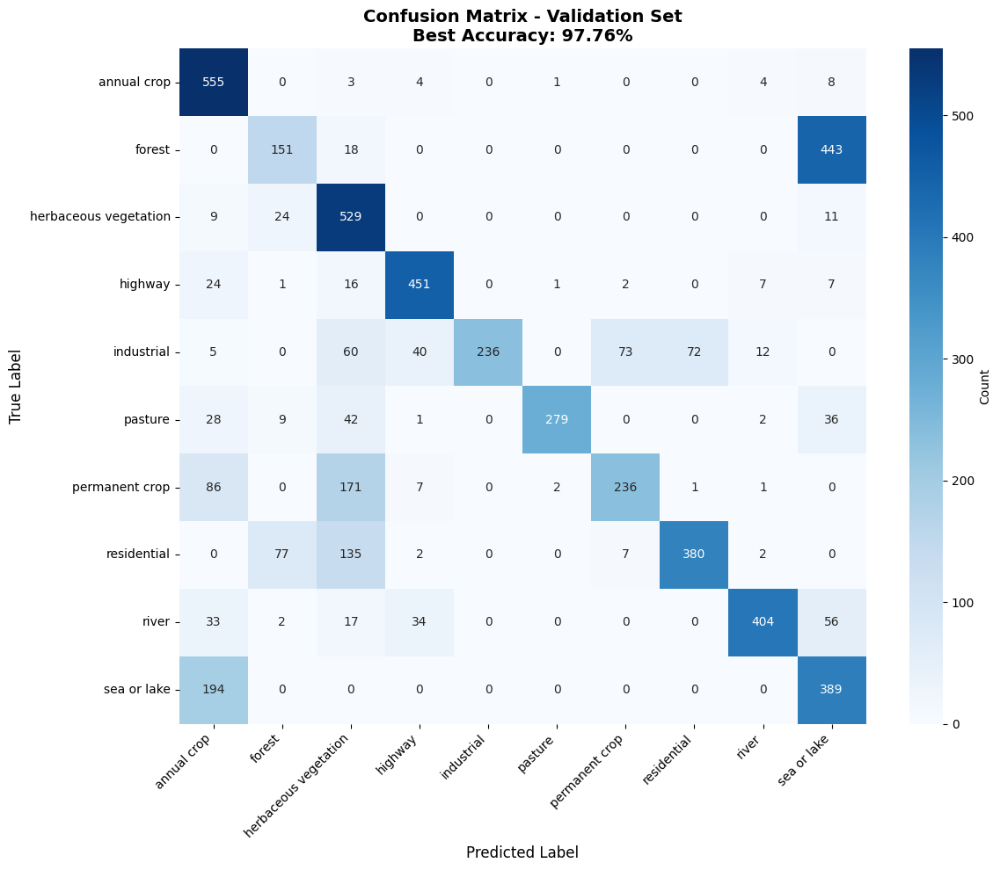


PER-CLASS ACCURACY
annual crop                   :  96.52% ( 555/ 575)
forest                        :  24.67% ( 151/ 612)
herbaceous vegetation         :  92.32% ( 529/ 573)
highway                       :  88.61% ( 451/ 509)
industrial                    :  47.39% ( 236/ 498)
pasture                       :  70.28% ( 279/ 397)
permanent crop                :  46.83% ( 236/ 504)
residential                   :  63.02% ( 380/ 603)
river                         :  73.99% ( 404/ 546)
sea or lake                   :  66.72% ( 389/ 583)
Overall Accuracy: 97.76%


In [45]:
# Generate Confusion Matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Get predictions on validation set
supervised_model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in val_loader:
        images = images.to(device)
        outputs = supervised_model(images)
        _, predicted = outputs.max(1)
        
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.numpy())

# Compute confusion matrix
cm = confusion_matrix(all_labels, all_preds)

# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=ID_CLASS_NAMES, 
            yticklabels=ID_CLASS_NAMES,
            cbar_kws={'label': 'Count'})
plt.title(f'Confusion Matrix - Validation Set\nBest Accuracy: {best_val_acc:.2f}%', 
          fontsize=14, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Calculate per-class accuracy
class_correct = cm.diagonal()
class_total = cm.sum(axis=1)
class_accuracy = 100.0 * class_correct / class_total

print("\n" + "="*60)
print("PER-CLASS ACCURACY")
print("="*60)
for i, class_name in enumerate(ID_CLASS_NAMES):
    print(f"{class_name:30s}: {class_accuracy[i]:6.2f}% ({class_correct[i]:4d}/{class_total[i]:4d})")
print("="*60)
print(f"Overall Accuracy: {best_val_acc:.2f}%")
print("="*60)